# Checking GPP of grid cells dominated C${_4}$ 250625 JOvwemuvwose

This script checks the GPP of the grid cells dominated by C${_4}$ vegetation. It also makes different plots and fits a regression line.

In [285]:
#IMPORT NEEDED LIBRARIES
import seaborn as sns
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.transforms as mtransforms  # Add this line if transforms are needed
from matplotlib.ticker import MaxNLocator #For ticks adjustment
from datetime import datetime
from sklearn.linear_model import LinearRegression
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import statsmodels.api as sm
from matplotlib.dates import date2num
import tempfile
import fsspec
%matplotlib inline
import warnings
warnings.simplefilter("ignore") 
import openpyxl
from statsmodels.tsa.seasonal import seasonal_decompose
from collections import OrderedDict
from scipy import stats

# CESM2

## Checking C4 GPP changes in grid

In [119]:
# cd to dir_path/needed_dataset.nc
#Load the gpp and area data for CESM2 for a start
cesmCrop = xr.open_dataset('cropFrac_Lmon_CESM2_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)
cesmGpp = xr.open_dataset('gpp_Lmon_CESM2_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)
cesmC3Pft = xr.open_dataset('c3PftFrac_Lmon_CESM2_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)
cesmC4Pft = xr.open_dataset('c4PftFrac_Lmon_CESM2_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)
cesmLand = xr.open_dataset('sftlf_fx_CESM2_piControl_r1i1p1f1_gn.nc', 
                           decode_times = True)
cesmArea = xr.open_dataset('areacella_fx_CESM2_piControl_r1i1p1f1_gn.nc', 
                           decode_times = True)

In [122]:
# Calculate total vegetation
cesmTotFrac = cesmC3Pft['c3PftFrac']/100 + cesmC4Pft['c4PftFrac']/100

# Calculate crop fraction
cesmCropFrac = cesmCrop['cropFrac']/100

# Calculate total natural vegetation
# Subtract the total and the crops and ignore the unaligned coordinates
cesmNatFrac = cesmTotFrac.values - cesmCropFrac.values

# Or use their numpy array 
#cesmNatFrac1 = cesmTotFrac.values - cesmCropFrac.values

# Calculate C3 and C4 crop and natural Frac = tions

# Needed for this analysis
cesmC4Frac = cesmC4Pft['c4PftFrac']/100
cesmC4NatFrac = cesmC4Frac * cesmNatFrac

'''# Not Needed for this analyis

#cesmC3Frac = cesmC3Pft['c3PftFrac']/100 
#cesmC3crpFrac = cesmC3Frac * cesmCropFrac
#cesmC4crpFrac = cesmC4Frac * cesmCropFrac
#cesmC3NatFrac = cesmC3Frac * cesmNatFrac'''


"# Not Needed for this analyis\n\n#cesmC3Frac = cesmC3Pft['c3PftFrac']/100 \n#cesmC3crpFrac = cesmC3Frac * cesmCropFrac\n#cesmC4crpFrac = cesmC4Frac * cesmCropFrac\n#cesmC3NatFrac = cesmC3Frac * cesmNatFrac"

# Mask the Data

### Create a function to extract the GPP of grid cells dominated by C${_4}$

In [165]:

# Create the function
def plot_c4_dominant_gpp(cesmC4NatFrac, cesmGpp, threshold=0.75):
    """
    Plots GPP time series where natural C4 vegetation dominates.

    Parameters:
    - cesmC4NatFrac: xarray.DataArray or Dataset of C4 fraction (dimensions: time, lat, lon)
    - cesmGpp: xarray.Dataset or DataArray with 'gpp' variable (same dimensions)
    - threshold: float, threshold to define "C4 dominant" (default = 0.75)
    """
    # Extract numpy arrays
    c4_frac = cesmC4NatFrac.values
    gpp = cesmGpp['gpp'].values if isinstance(cesmGpp, xr.Dataset) else cesmGpp.values

    # Multiply GPP by C4 fraction
    gpp_weighted = c4_frac * gpp

    # Create mask where C4 fraction >= threshold
    mask = c4_frac >= threshold

    # Apply mask (set to np.nan where mask is False)
    gpp_masked = np.where(mask, gpp, np.nan)
    gpp_weighted_masked = np.where(mask, gpp_weighted, np.nan)

    # Compute spatial mean for each time step
    C4gpp_masked_mean = np.nanmean(gpp_masked, axis=(1, 2))
    area_weighted_C4gpp_masked_mean = np.nanmean(gpp_weighted_masked, axis=(1, 2))

    # Generate date range for the plot
    date_range = pd.date_range(start='15/01/1850', periods=1980, freq='M')
    
    # Plotting
    plt.figure(figsize=(10, 5))
    plt.plot(date_range, C4gpp_masked_mean, label='C4gpp_masked_mean')
    plt.plot(date_range,  area_weighted_C4gpp_masked_mean, 
             label='area_weighted_C4gpp_masked_mean')
    plt.xlabel("Time Index")
    plt.ylabel("GPP")
    plt.title("CESM Natural C4-Dominant GPP Time Series")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    return C4gpp_masked_mean, area_weighted_C4gpp_masked_mean

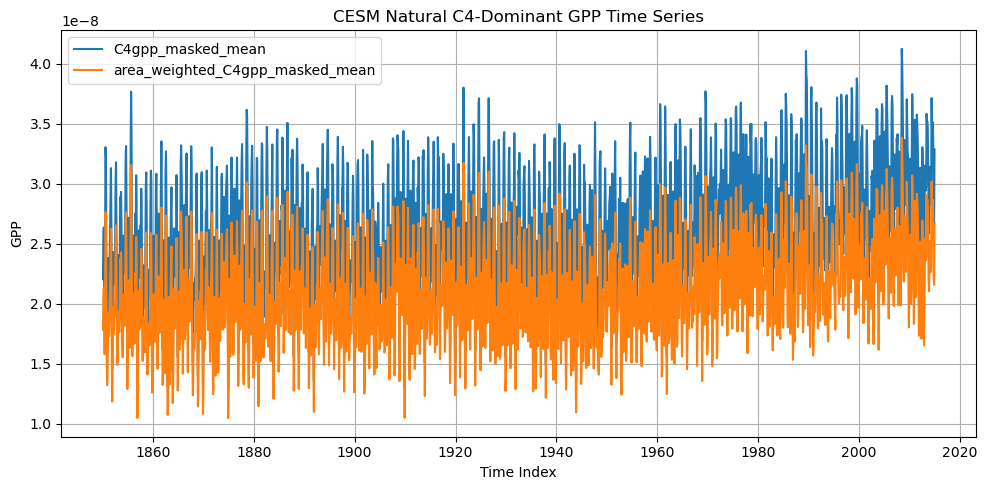

In [166]:
cesmC4_domGPP, cesmC4_domGPP_area_weighted = plot_c4_dominant_gpp(cesmC4NatFrac, cesmGpp)

### Create a function to decompose the C${_4}$ dominated gride cells GPP trends

In [72]:
# define the function that uses numpy
def decomposePlot1(data, title, csvfilename_series, csvfilename_trend, pngfilename):
    # Generate date range
    date_range = pd.date_range(start='15/01/1850', periods=1980, freq='M')
    data = (data.flatten()) * 10e6
    
    # Convert to time series
    time_series = pd.Series(data, index=date_range)
    
    # Save the time series as a CSV file
    time_series.to_csv(csvfilename_series, header=['Value'], index_label='Date')

    # Decompose the time series
    decomposition = seasonal_decompose(time_series, model='additive')

    # Extract components
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid
    
    # Make a copy of the CESM2 trend
    trend1 = trend.copy()
    
    # Save the trend as a CSV file (overwrites the previous one)
    trend.to_csv(csvfilename_trend, header=['Value'], index_label='Date')

    # Plot the components
    plt.figure(figsize=(12, 8))
    plt.subplot(411)
    plt.plot(time_series, label='Original')
    plt.title(title, fontsize=16)
    plt.legend(loc='best')
    plt.subplot(412)
    plt.plot(trend, label='Trend')
    plt.ylabel('GPP [mgCm$^{-2}$ s$^{-1}$]', fontsize=16)
    plt.grid()
    plt.legend(loc='best')
    plt.subplot(413)
    plt.plot(seasonal, label='Seasonal')
    plt.legend(loc='best')
    plt.subplot(414)
    plt.plot(residual, label='Residual')

    # Save the figure
    plt.savefig(pngfilename, dpi=500, bbox_inches='tight', pad_inches=0.1)
    
    # Show the plot
    plt.show()
    
    return trend1

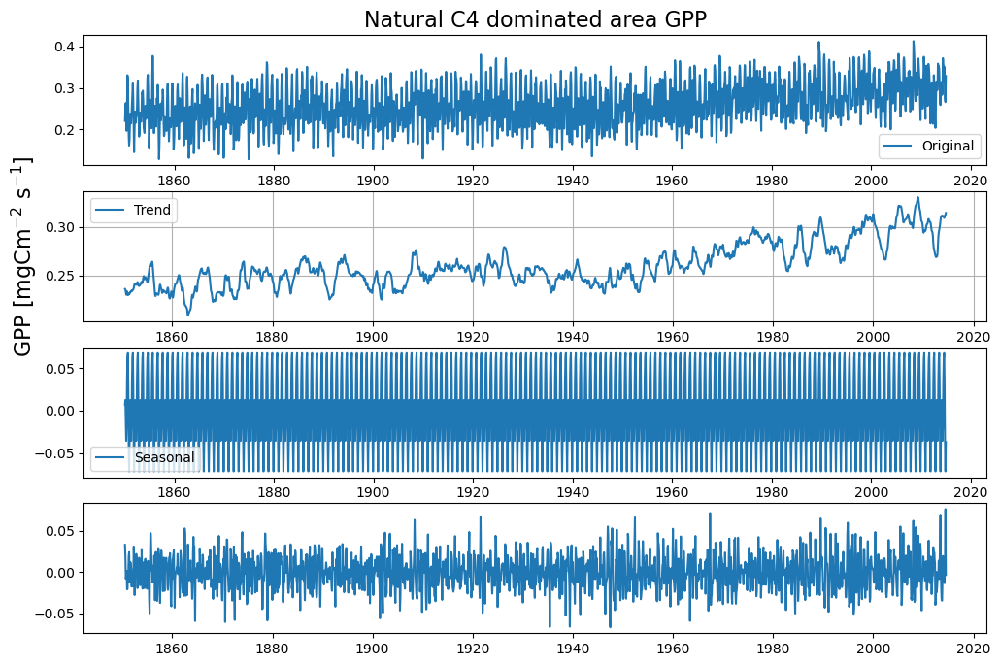

In [85]:
# Call the function
cesm_trend1 = decomposePlot1(cesmC4_domGPP, 
                   'Natural C4 dominated area GPP','cesmC4timeseries_noC4Frac1.csv',
                   'cesmC4trend_noC4Frac1.csv','cesmDecomposedNatC4_noC4Frac1.png')

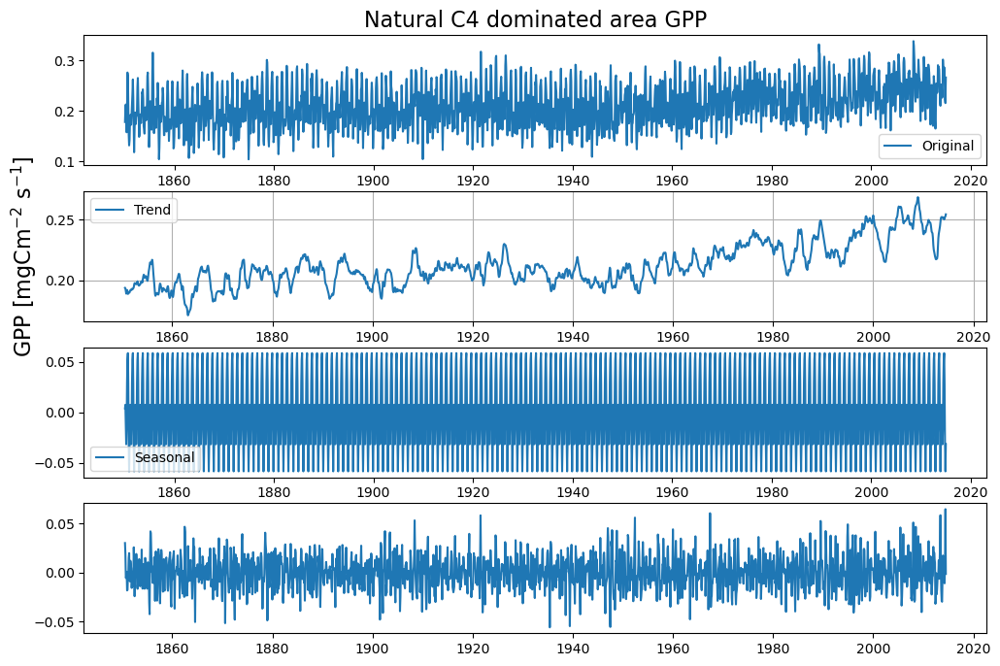

In [96]:
# Call the function
cesm_trend2 = decomposePlot1(C_masked_mean, 
                   'Natural C4 dominated area GPP','cesmC4timeseries_withC4Frac1.csv',
                   'cesmC4trend_withC4Frac1.csv','cesmDecomposedNatC4_withC4Frac1.png')

### Create a function to plot the C${_4}$ GPP time series and fit a regression line

In [74]:
# Define the function
def plotTimeSeriespPolyfit1(data, title, filename):
    """
    Plots a time series scatter plot with a polynomial trend line and 
    prints the polynomial coefficients, p-values, and R-squared. 
    Saves the plot as an image file.

    Parameters:
    - time_series: pandas Series with datetime index and numerical values
    - title: Title of the plot
    - filename: Name of the file to save the plot (e.g., 'plot.png')
    """
    
    # Prepare data
    # Generate date range
    date_range = pd.date_range(start='15/01/1850', periods=1980, freq='M')
    
    data = (data.flatten()) * 10e6
    
    # Convert to time series
    time_series = pd.Series(data, index=date_range)
    
    # Scatter plot
    plt.figure(figsize=(12, 6))
    plt.scatter(time_series.index, time_series.values, label='Data', s=10)

    # Polynomial regression (2nd degree)
    x = time_series.index.map(pd.Timestamp.toordinal).to_numpy()
    y = time_series.values
    coeffs = np.polyfit(x, y, 2)
    poly_trend = np.polyval(coeffs, x)

    # Calculate R-squared
    residuals = y - poly_trend
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((y - np.mean(y))**2)
    r_squared = 1 - (ss_res / ss_tot)

    # Calculate p-values
    X = np.vstack([x**2, x, np.ones_like(x)]).T
    beta = np.linalg.lstsq(X, y, rcond=None)[0]
    y_pred = X @ beta
    dof = len(y) - X.shape[1]
    mse = np.sum((y - y_pred)**2) / dof
    var_beta = mse * np.linalg.inv(X.T @ X).diagonal()
    t_stats = beta / np.sqrt(var_beta)
    p_values = 2 * (1 - stats.t.cdf(np.abs(t_stats), df=dof))

    # Plot polynomial trend line
    plt.plot(time_series.index, poly_trend, color='black', 
             label='Polynomial Trend Line (2nd degree)', linewidth=2)

    # Labels and legend
    #plt.xlabel('Date')
    plt.ylabel('GPP [mgCm$^{-2}$ s$^{-1}$]', fontsize=16)
    plt.title(title, fontsize=16)
    #plt.xticks(rotation=60)
    plt.legend()

    # Grid and axis styling
    plt.grid(True, linewidth=0.5)  # Thinner gridlines
    plt.tick_params(axis='both', which='major', labelsize=14)  # Larger tick labels
    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # Add R² text below the legend
    plt.text(0.05, 0.95, f'R² = {r_squared:.3f}', transform=ax.transAxes,
             fontsize=14, verticalalignment='top')

    plt.tight_layout()

    # Save the plot
    plt.savefig(filename, dpi=500, bbox_inches='tight', pad_inches=0.1)

    # Show the plot
    plt.show()

    # Print results
    #print(f"Polynomial Coefficients: {coeffs}")
    #print(f"P-values: {p_values}")
    #print(f"R-squared: {r_squared}")


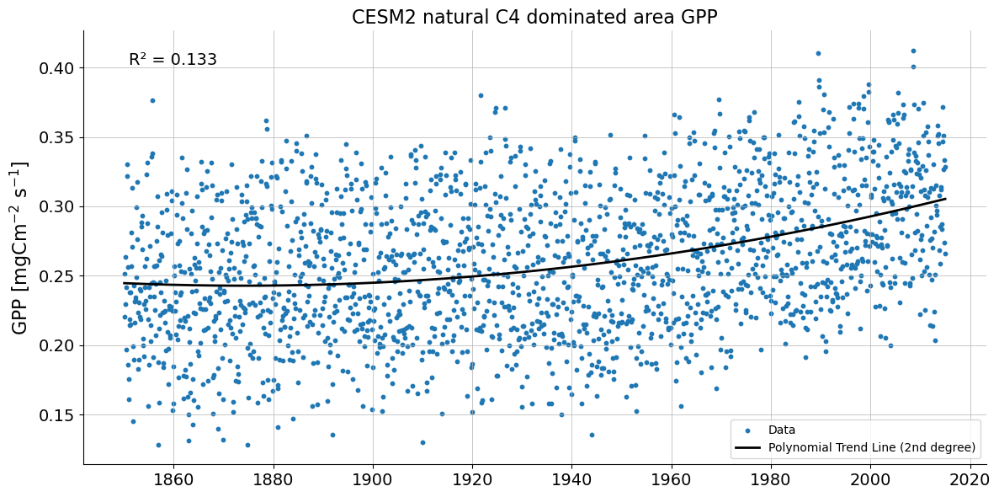

In [86]:
plotTimeSeriespPolyfit1(mean_timeseries, 
                                       "CESM2 natural C4 dominated area GPP",
                                      'cesm_noC4FracNatC4gpp1.png')

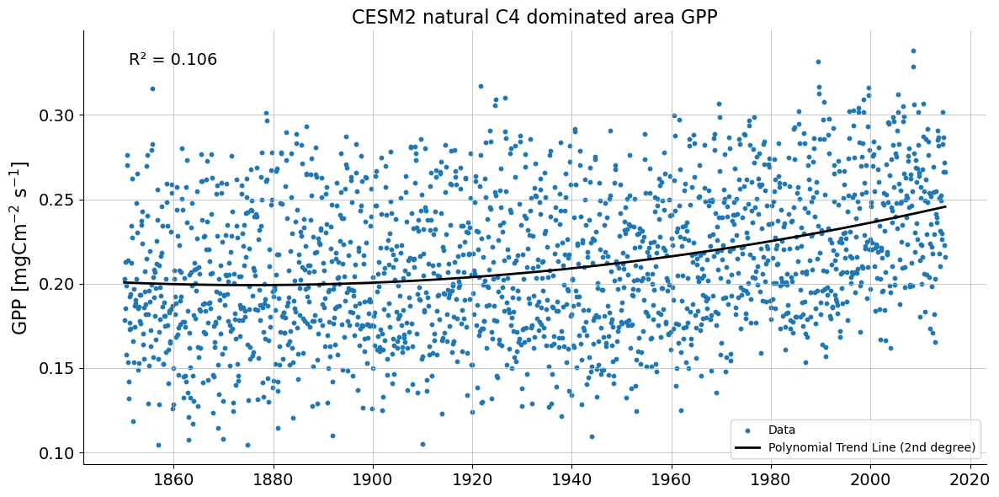

In [98]:
plotTimeSeriespPolyfit1(C_masked_mean, 
                                       "CESM2 natural C4 dominated area GPP",
                                      'cesm_withC4FracNatC4gpp1.png')

In [99]:
xxx = mean_timeseries - C_masked_mean

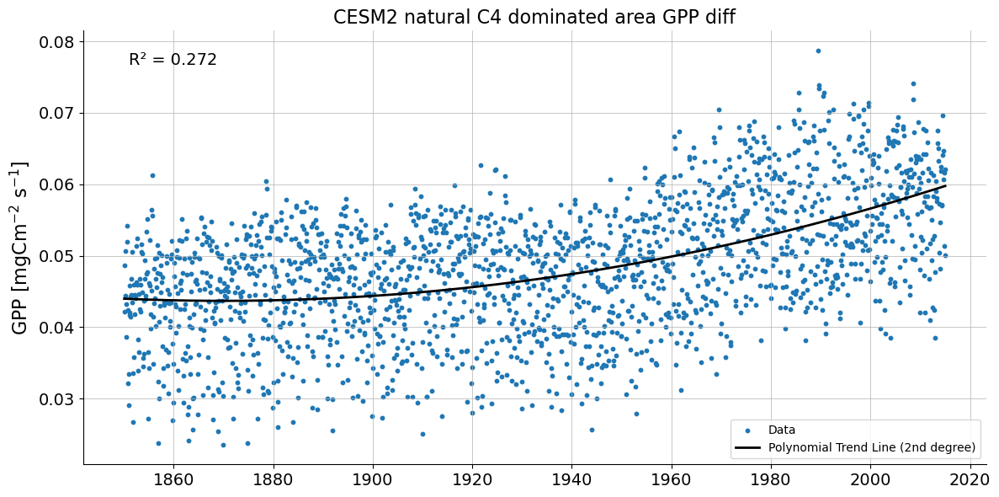

In [100]:
plotTimeSeriespPolyfit1(xxx, "CESM2 natural C4 dominated area GPP diff",
                        'cesm_difC4FracNatC4gpp1.png')

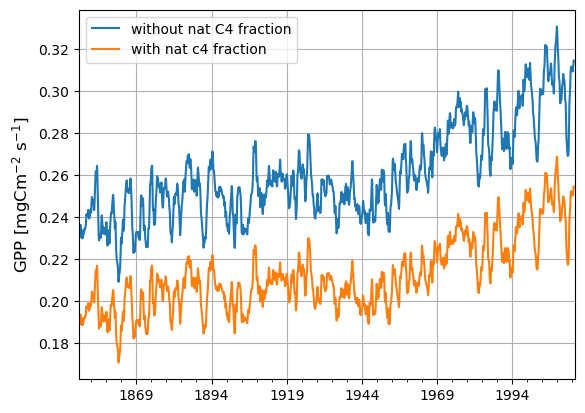

In [103]:
cesm_trend1.plot(label = 'without nat C4 fraction')
cesm_trend2.plot(label = 'with nat c4 fraction')
plt.ylabel('GPP [mgCm$^{-2}$ s$^{-1}$]', fontsize=12)
plt.legend()
plt.grid()
plt.show()

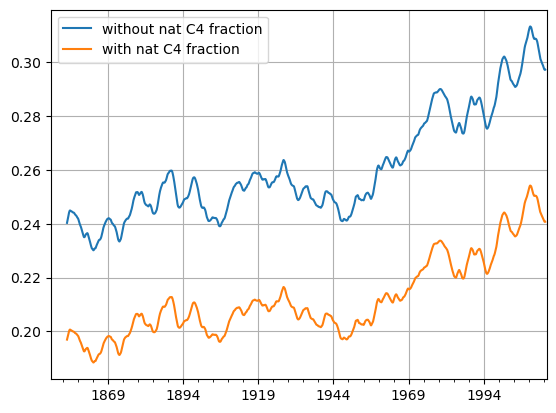

In [104]:
# Use moving average of last 6 months

cesm_trend1_moving_average = cesm_trend1.rolling(window=60).mean()
cesm_trend2_moving_average = cesm_trend2.rolling(window=60).mean()
cesm_trend1_moving_average.plot(label = 'without nat C4 fraction')
cesm_trend2_moving_average.plot(label = 'with nat C4 fraction')
plt.grid()
plt.legend()
plt.show()

# UKESM1

In [149]:
pwd

'/Users/jo122/CMIP6/Data_CMIP6_model_output/CMIP6_models/CESM2'

In [151]:
cd UKESM1-0-LL/

/Users/jo122/CMIP6/Data_CMIP6_model_output/CMIP6_models/UKESM1-0-LL


In [152]:
ls

areacella_fx_UKESM1-0-LL_piControl_r1i1p1f2_gn.nc
c3PftFrac/
c4PftFrac/
checkNatC4GPP/
cLand/
cLand_output/
cLand_output1/
crop_change_20140118/
cropFrac/
cropFracC3/
cropFracC4/
cSoil/
cVeg/
cVeg_outputs/
figures/
gpp/
npp/
Outputs/
sftlf_fx_UKESM1-0-LL_piControl_r1i1p1f2_gn.nc
ukes_outputs/
ukes_outputs1/
UKESM1-0-LL_c3c4_Total_Abundace_1850-2014.csv
UKESM1-0-LL_Crop.jpeg
UKESM1-0-LL_cropChange_1850-2014a1.nc
UKESM1-0-LL_cropMeanChange_1850-2014.nc
UKESM1-0-LL_Nat.jpeg
UKESM1-0-LL_Total.jpeg
ukesm1CropChange.jpeg
ukesm1CropMean.jpeg


In [157]:
#Load the gpp and area data for ukes2 for a start
ukesCrop = xr.open_mfdataset('cropFrac/*.nc', 
                           decode_times = True)
ukesGpp = xr.open_mfdataset('gpp/*.nc', 
                           decode_times = True)
ukesC3Pft = xr.open_mfdataset('c3PftFrac/*.nc', 
                           decode_times = True)
ukesC4Pft = xr.open_mfdataset('c4PftFrac/*.nc', 
                           decode_times = True)
ukesC3crp = xr.open_mfdataset('cropFracC3/*.nc', 
                           decode_times = True)
ukesC4crp = xr.open_mfdataset('cropFracC4/*.nc', 
                           decode_times = True)
ukesLand = xr.open_dataset('sftlf_fx_UKESM1-0-LL_piControl_r1i1p1f2_gn.nc', 
                           decode_times = True)
ukesArea = xr.open_dataset('areacella_fx_UKESM1-0-LL_piControl_r1i1p1f2_gn.nc', 
                           decode_times = True)

In [163]:
# Calculate total vegetation
ukesTotFrac = ukesC3Pft['c3PftFrac']/100 + ukesC4Pft['c4PftFrac']/100

# Calculate crop fraction
ukesCropFrac = ukesCrop['cropFrac']/100

# Calculate total natural vegetation
# Subtract the total and the crops and ignore the unaligned coordinates
ukesNatFrac = ukesTotFrac.values - ukesCropFrac.values

# Or use their numpy array 
#ukesNatFrac1 = ukesTotFrac.values - ukesCropFrac.values

# Calculate C3 and C4 crop and natural Frac = tions

# Needed for this analysis
ukesC4Frac = ukesC4Pft['c4PftFrac']/100
ukesC4NatFrac = ukesC4Frac * ukesNatFrac

# Not Needed for this analyis

ukesC3Frac = ukesC3Pft['c3PftFrac']/100 
ukesC3crpFrac = ukesC3crp['cropFracC3']/100
ukesC4crpFrac = ukesC4crp['cropFracC4']/100 
ukesC3NatFrac = ukesC3Frac * ukesNatFrac


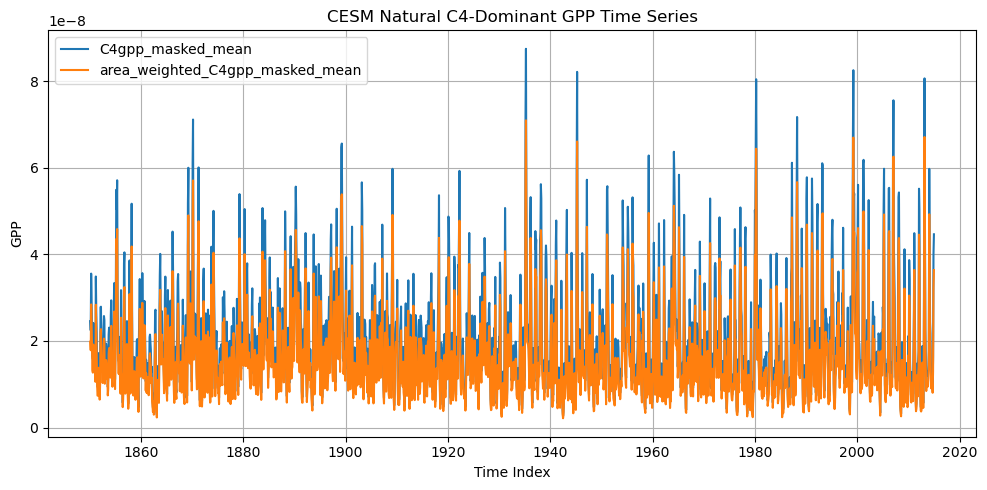

In [167]:
# Apply the function to calculate the time_series mean of C4 dominated GPP
ukesC4_domGPP, ukesC4_domGPP_area_weighted = plot_c4_dominant_gpp(ukesC4NatFrac, ukesGpp)

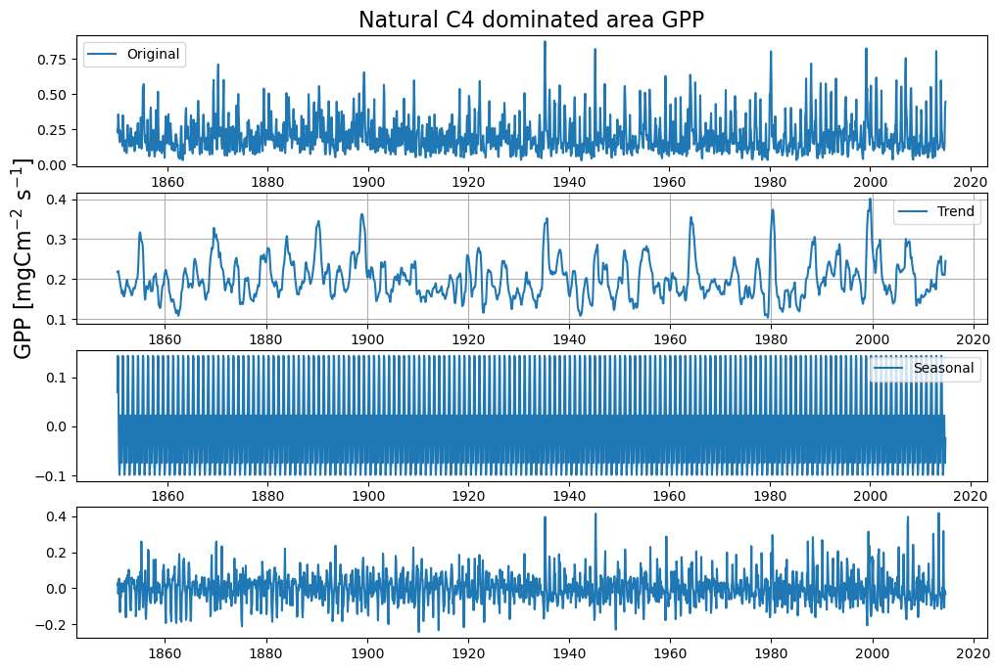

In [177]:
ukes_trend1 = decomposePlot1(ukesC4_domGPP, 
                   'Natural C4 dominated area GPP','ukesC4timeseries_noC4Frac1.csv',
                   'ukesC4trend_noC4Frac1.csv','ukesDecomposedNatC4_noC4Frac1.png')

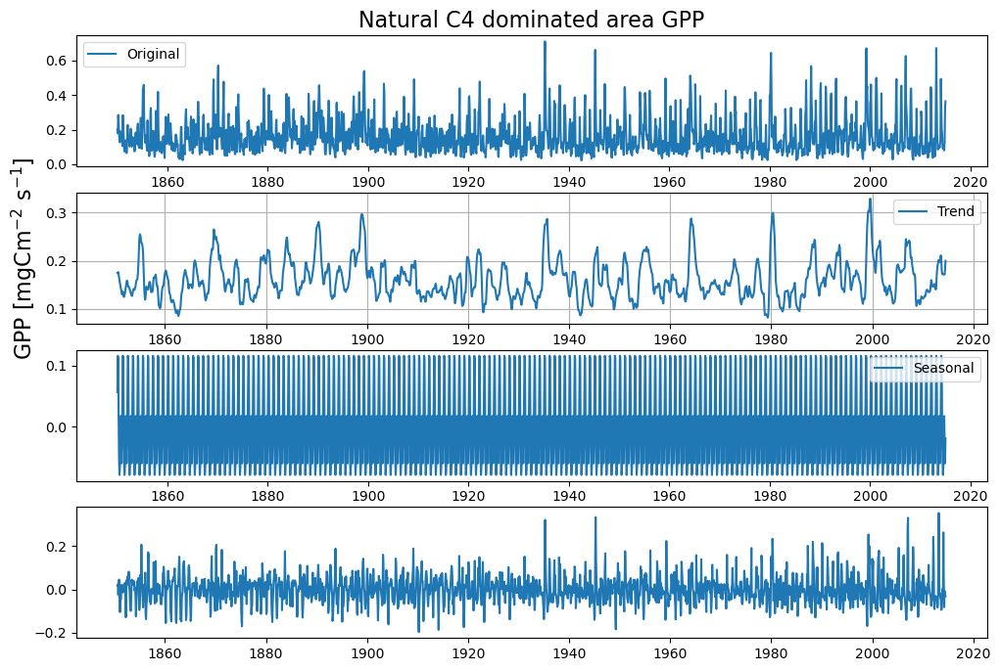

In [178]:
ukes_trend2 = decomposePlot1(ukesC4_domGPP_area_weighted, 
                   'Natural C4 dominated area GPP','ukesC4timeseries_withC4Frac1.csv',
                   'ukesC4trend_withC4Frac1.csv','ukesDecomposedNatC4_withC4Frac1.png')

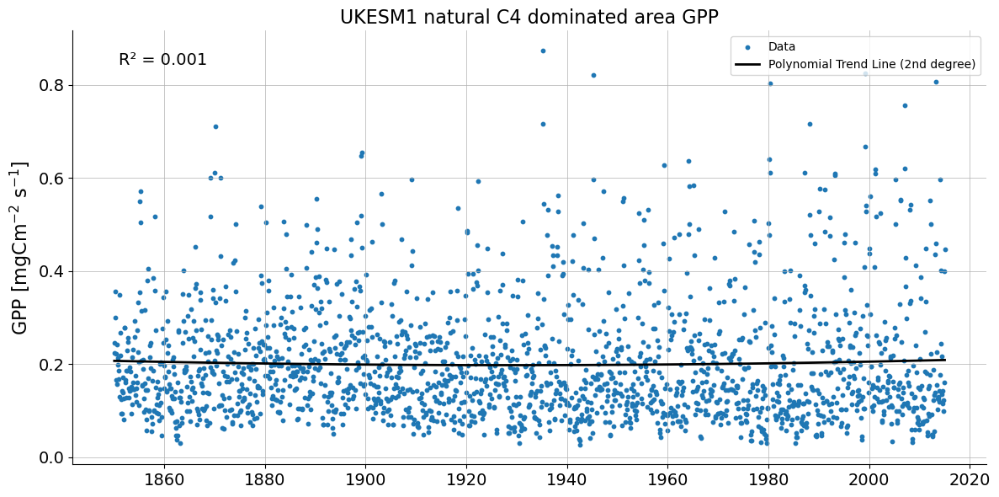

In [179]:
plotTimeSeriespPolyfit1(ukesC4_domGPP, 
                                       "UKESM1 natural C4 dominated area GPP",
                                      'ukes_noC4FracNatC4gpp1.png')

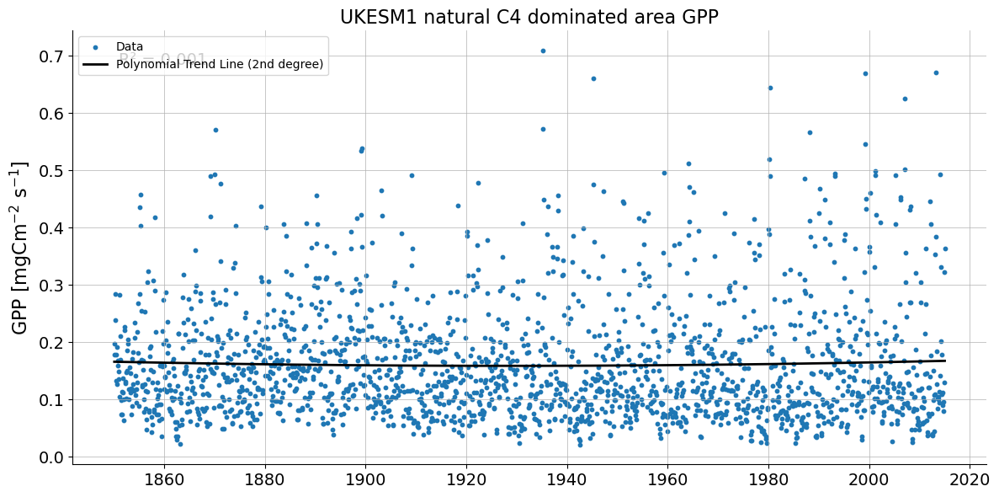

In [180]:
plotTimeSeriespPolyfit1(ukesC4_domGPP_area_weighted, 
                        "UKESM1 natural C4 dominated area GPP",
                        'ukes_withC4FracNatC4gpp1.png')

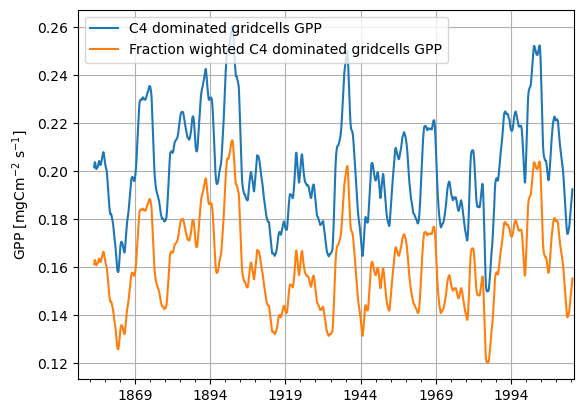

In [185]:
# Use moving average of last 6 months

ukes_trend1_moving_average = ukes_trend1.rolling(window=60).mean()
ukes_trend2_moving_average = ukes_trend2.rolling(window=60).mean()
ukes_trend1_moving_average.plot(label = 'C4 dominated gridcells GPP')
ukes_trend2_moving_average.plot(label = 'Fraction wighted C4 dominated gridcells GPP')
plt.ylabel('GPP [mgCm$^{-2}$ s$^{-1}$]')
plt.grid()
plt.legend()
plt.show()

# MPI-ESM-1-2-HAM

In [190]:
#Load the gpp and area data for mpeh2 for a start
mpehCrop = xr.open_mfdataset('cropFrac/*.nc', 
                           decode_times = True)
mpehGpp = xr.open_mfdataset('gpp/*.nc', 
                           decode_times = True)
mpehC3Pft = xr.open_mfdataset('c3PftFrac/*.nc', 
                           decode_times = True)
mpehC4Pft = xr.open_mfdataset('c4PftFrac/*.nc', 
                           decode_times = True)
mpehC3crp = xr.open_mfdataset('cropFracC3/*.nc', 
                           decode_times = True)
mpehC4crp = xr.open_mfdataset('cropFracC4/*.nc', 
                           decode_times = True)
mpehLand = xr.open_dataset('sftlf_fx_MPI-ESM-1-2-HAM_piControl_r1i1p1f1_gn.nc', 
                           decode_times = True)
mpehArea = xr.open_dataset('areacella_fx_MPI-ESM-1-2-HAM_piControl_r1i1p1f1_gn.nc', 
                           decode_times = True)

In [191]:
# Calculate total vegetation
mpehTotFrac = mpehC3Pft['c3PftFrac']/100 + mpehC4Pft['c4PftFrac']/100

# Calculate crop fraction
mpehCropFrac = mpehCrop['cropFrac']/100

# Calculate total natural vegetation
# Subtract the total and the crops and ignore the unaligned coordinates
mpehNatFrac = mpehTotFrac.values - mpehCropFrac.values

# Or use their numpy array 
#mpehNatFrac1 = mpehTotFrac.values - mpehCropFrac.values

# Calculate C3 and C4 crop and natural Frac = tions

# Needed for this analysis
mpehC4Frac = mpehC4Pft['c4PftFrac']/100
mpehC4NatFrac = mpehC4Frac * mpehNatFrac

# Not Needed for this analyis

mpehC3Frac = mpehC3Pft['c3PftFrac']/100 
mpehC3crpFrac = mpehC3crp['cropFracC3']/100
mpehC4crpFrac = mpehC4crp['cropFracC4']/100 
mpehC3NatFrac = mpehC3Frac * mpehNatFrac


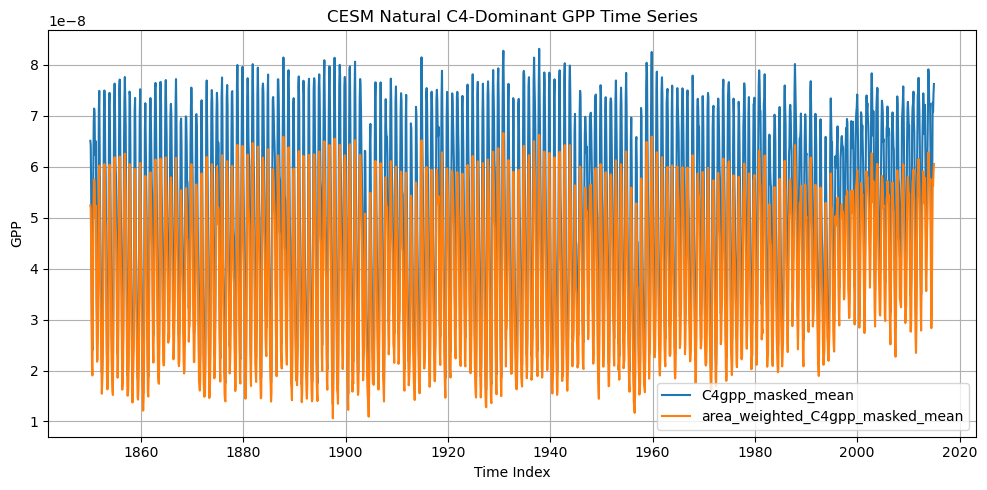

In [192]:
# Apply the function to calculate the time_series mean of C4 dominated GPP
mpehC4_domGPP, mpehC4_domGPP_area_weighted = plot_c4_dominant_gpp(mpehC4NatFrac, mpehGpp)

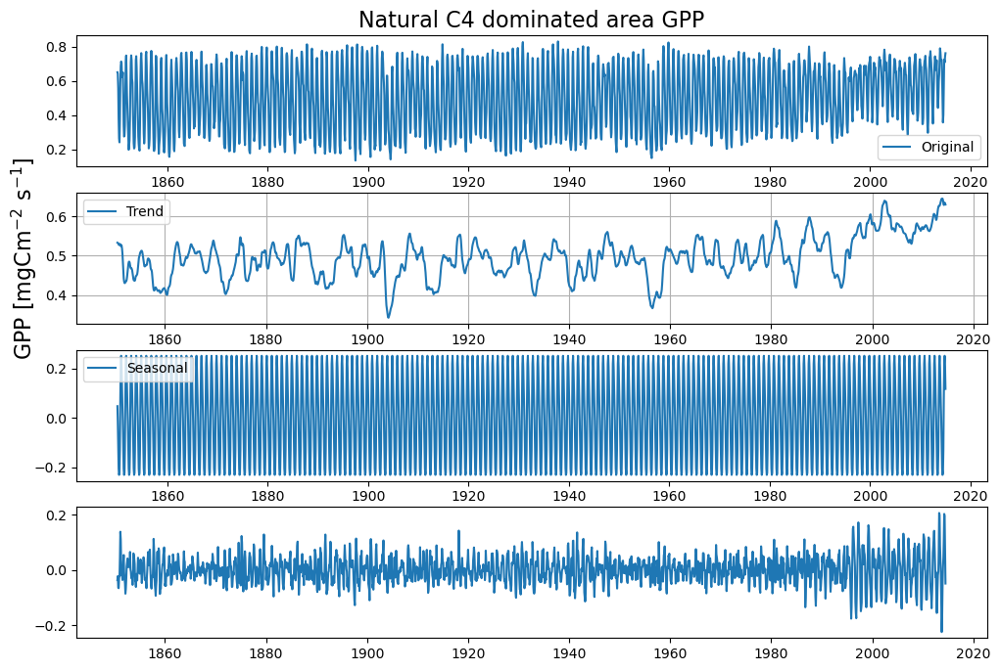

In [195]:
mpeh_trend1 = decomposePlot1(mpehC4_domGPP, 
                   'Natural C4 dominated area GPP','mpehC4timeseries_noC4Frac1.csv',
                   'mpehC4trend_noC4Frac1.csv','mpehDecomposedNatC4_noC4Frac1.png')

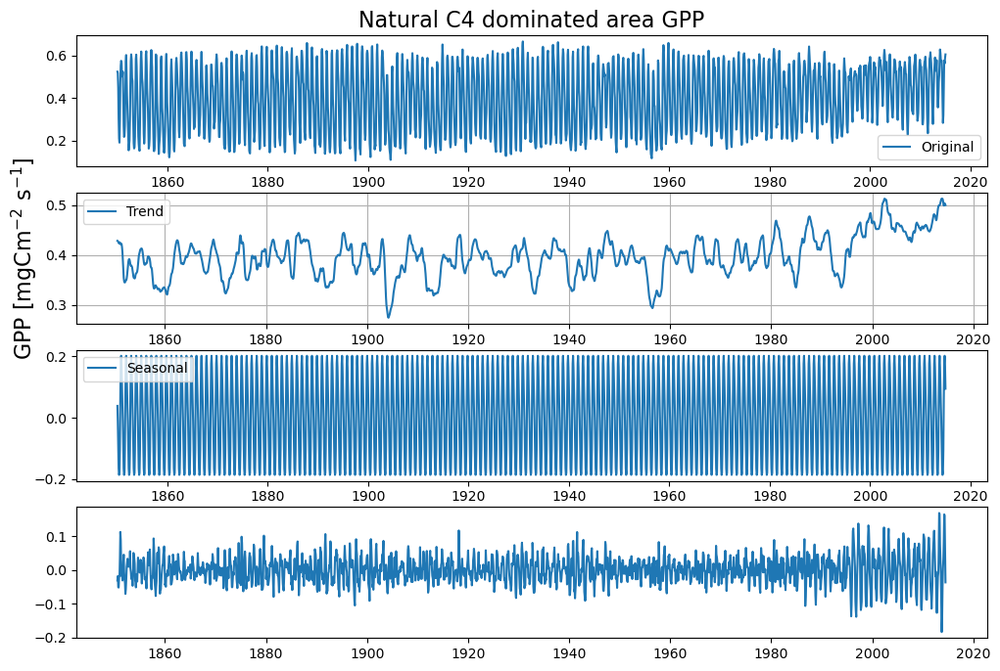

In [196]:
mpeh_trend2 = decomposePlot1(mpehC4_domGPP_area_weighted, 
                   'Natural C4 dominated area GPP','mpehC4timeseries_withC4Frac1.csv',
                   'mpehC4trend_withC4Frac1.csv','mpehDecomposedNatC4_withC4Frac1.png')

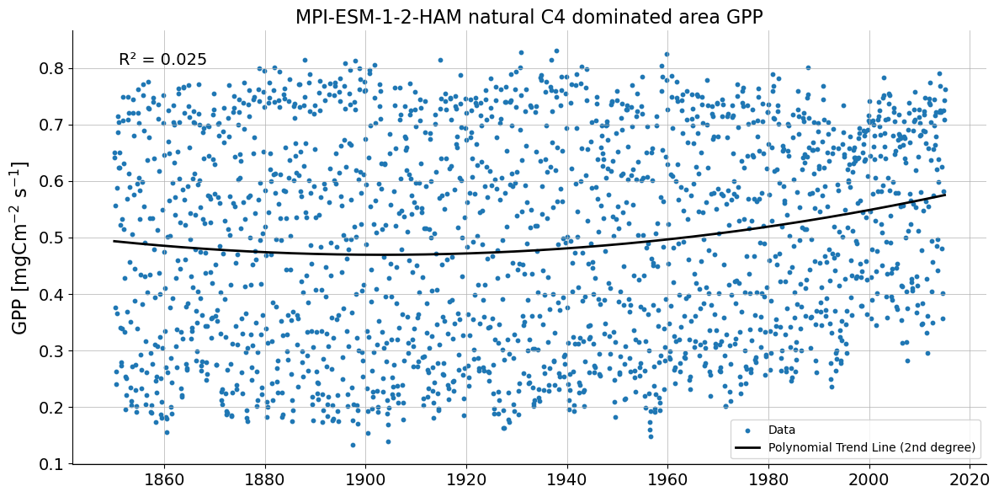

In [197]:
plotTimeSeriespPolyfit1(mpehC4_domGPP, 
                                       "MPI-ESM-1-2-HAM natural C4 dominated area GPP",
                                      'mpeh_noC4FracNatC4gpp1.png')

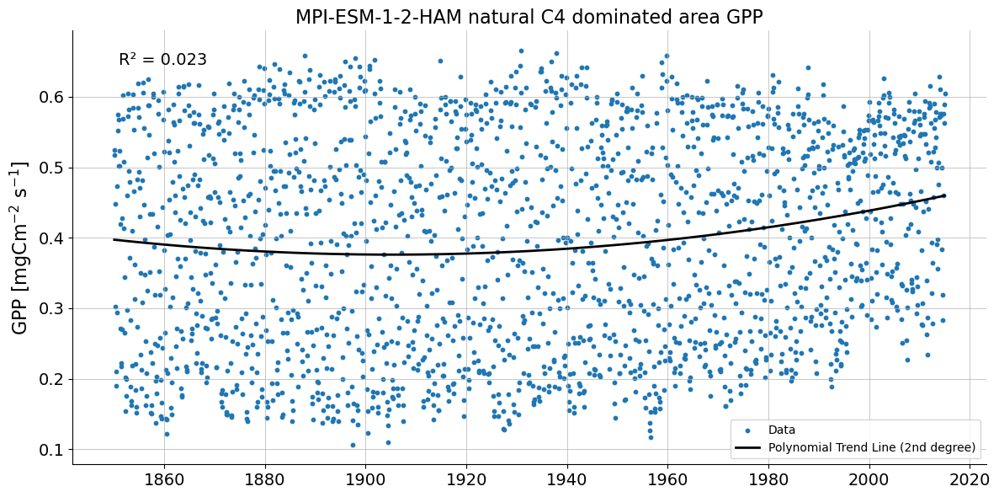

In [198]:
plotTimeSeriespPolyfit1(mpehC4_domGPP_area_weighted, 
                        "MPI-ESM-1-2-HAM natural C4 dominated area GPP",
                        'mpeh_withC4FracNatC4gpp1.png')

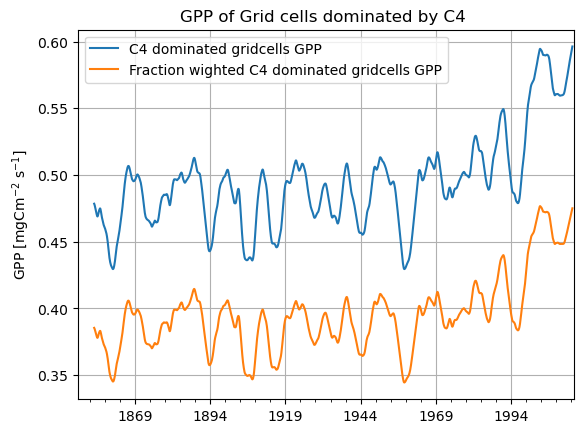

In [199]:
# Use moving average of last 6 months

mpeh_trend1_moving_average = mpeh_trend1.rolling(window=60).mean()
mpeh_trend2_moving_average = mpeh_trend2.rolling(window=60).mean()
mpeh_trend1_moving_average.plot(label = 'C4 dominated gridcells GPP')
mpeh_trend2_moving_average.plot(label = 'Fraction wighted C4 dominated gridcells GPP')
plt.ylabel('GPP [mgCm$^{-2}$ s$^{-1}$]')
plt.title('GPP of Grid cells dominated by C4 ')
plt.grid()
plt.legend()
plt.show()

# ACCESS-ESM1-5

In [231]:
#Load the gpp and area data for aces2 for a start
acesCrop = xr.open_dataset('cropFrac_Lmon_ACCESS-ESM1-5_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)
acesGpp = xr.open_dataset('gpp_Lmon_ACCESS-ESM1-5_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)
acesC3Pft = xr.open_dataset('c3PftFrac_Lmon_ACCESS-ESM1-5_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)
acesC4Pft = xr.open_dataset('c4PftFrac_Lmon_ACCESS-ESM1-5_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)
acesLand = xr.open_dataset('sftlf_fx_ACCESS-ESM1-5_piControl_r1i1p1f1_gn.nc', 
                           decode_times = True)
acesArea = xr.open_dataset('areacella_fx_ACCESS-ESM1-5_piControl_r1i1p1f1_gn.nc', 
                           decode_times = True)
acesC3crp = xr.open_dataset('cropFracC3_Emon_ACCESS-ESM1-5_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)

In [229]:
cd ..

/Users/jo122/CMIP6/Data_CMIP6_model_output/CMIP6_models


In [230]:
cd ACCESS-ESM1-5/

/Users/jo122/CMIP6/Data_CMIP6_model_output/CMIP6_models/ACCESS-ESM1-5


In [204]:
# Calculate total vegetation
acesTotFrac = acesC3Pft['c3PftFrac']/100 + acesC4Pft['c4PftFrac']/100

# Calculate crop fraction
acesCropFrac = acesCrop['cropFrac']/100

# Calculate total natural vegetation
# Subtract the total and the crops and ignore the unaligned coordinates
acesNatFrac = acesTotFrac.values - acesCropFrac.values

# Or use their numpy array 
#acesNatFrac1 = acesTotFrac.values - acesCropFrac.values

# Calculate C3 and C4 crop and natural Frac = tions

# Needed for this analysis
acesC4Frac = acesC4Pft['c4PftFrac']/100
acesC4NatFrac = acesC4Frac * acesNatFrac

# Not Needed for this analyis

#acesC3Frac = acesC3Pft['c3PftFrac']/100 
#acesC3crpFrac = acesC3crp['cropFracC3']/100
#acesC4crpFrac = (acesCropFrac.values - acesC3crpFrac.values)/100 
#acesC3NatFrac = acesC3Frac * acesNatFrac


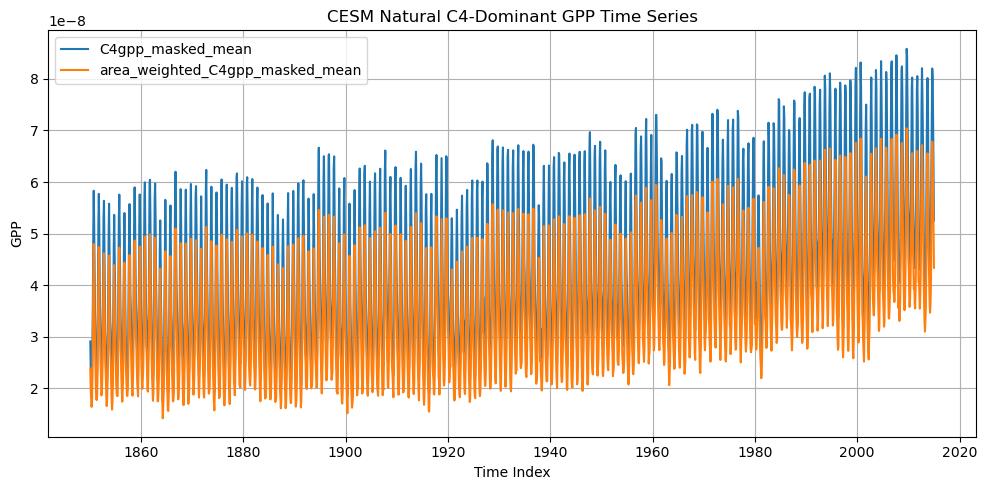

In [206]:
# Apply the function to calculate the time_series mean of C4 dominated GPP
acesC4_domGPP, acesC4_domGPP_area_weighted = plot_c4_dominant_gpp(acesC4NatFrac, acesGpp)

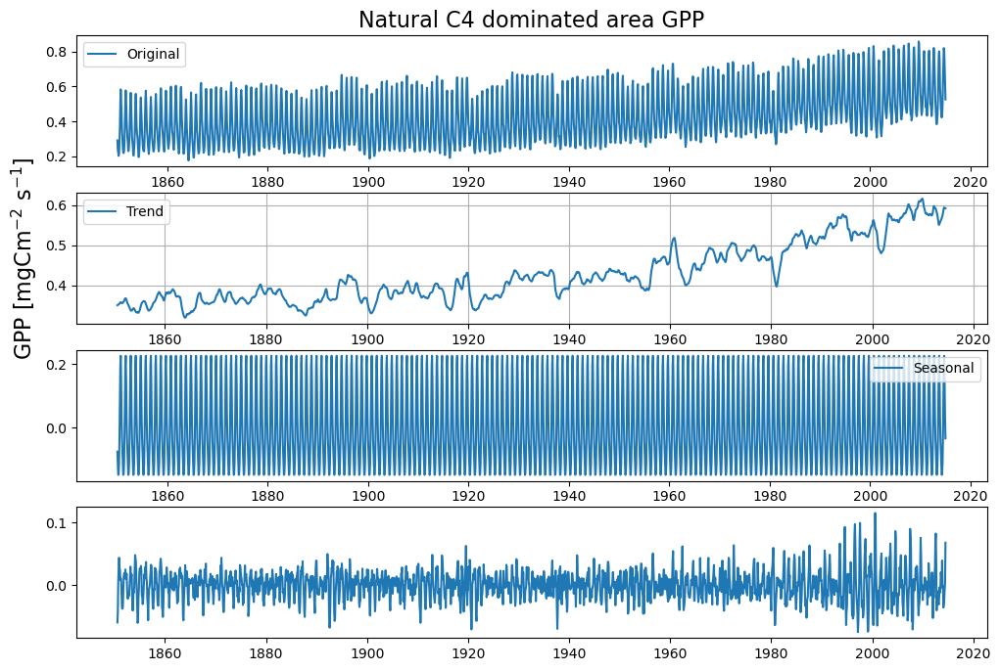

In [207]:
aces_trend1 = decomposePlot1(acesC4_domGPP, 
                   'Natural C4 dominated area GPP','acesC4timeseries_noC4Frac1.csv',
                   'acesC4trend_noC4Frac1.csv','acesDecomposedNatC4_noC4Frac1.png')

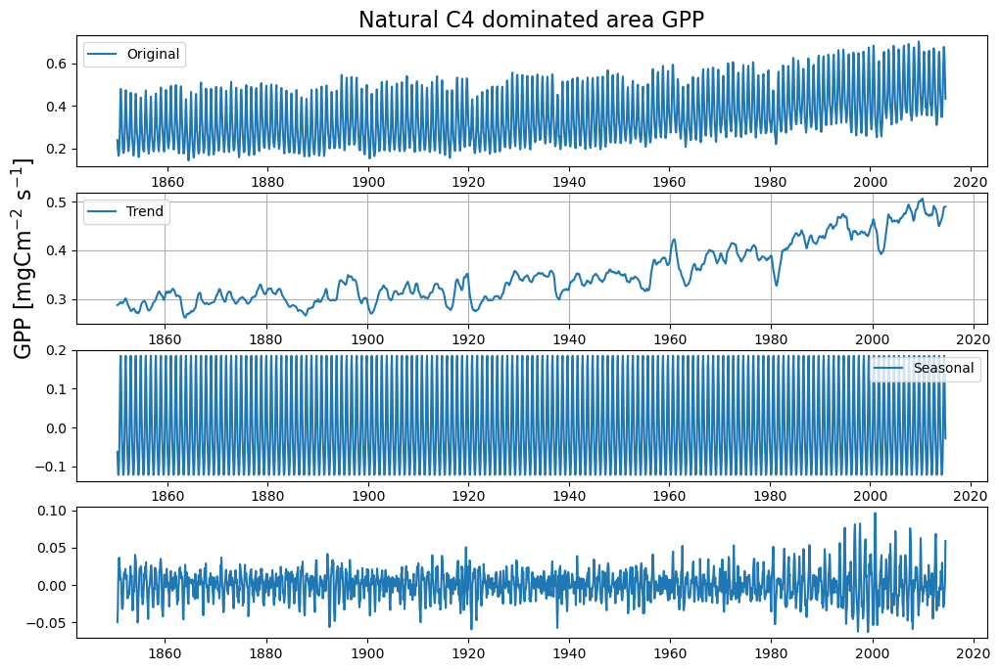

In [208]:
aces_trend2 = decomposePlot1(acesC4_domGPP_area_weighted, 
                   'Natural C4 dominated area GPP','acesC4timeseries_withC4Frac1.csv',
                   'acesC4trend_withC4Frac1.csv','acesDecomposedNatC4_withC4Frac1.png')

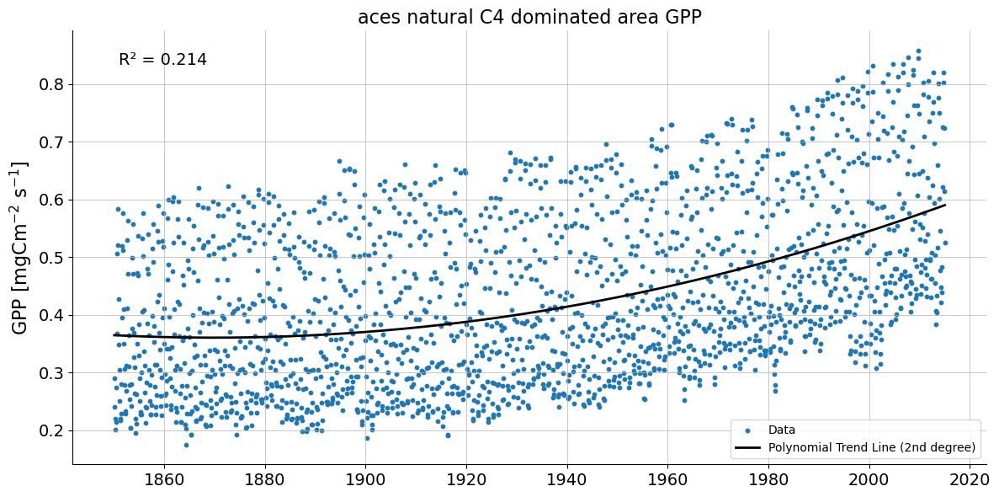

In [209]:
plotTimeSeriespPolyfit1(acesC4_domGPP, 
                        "aces natural C4 dominated area GPP",
                        'aces_noC4FracNatC4gpp1.png')

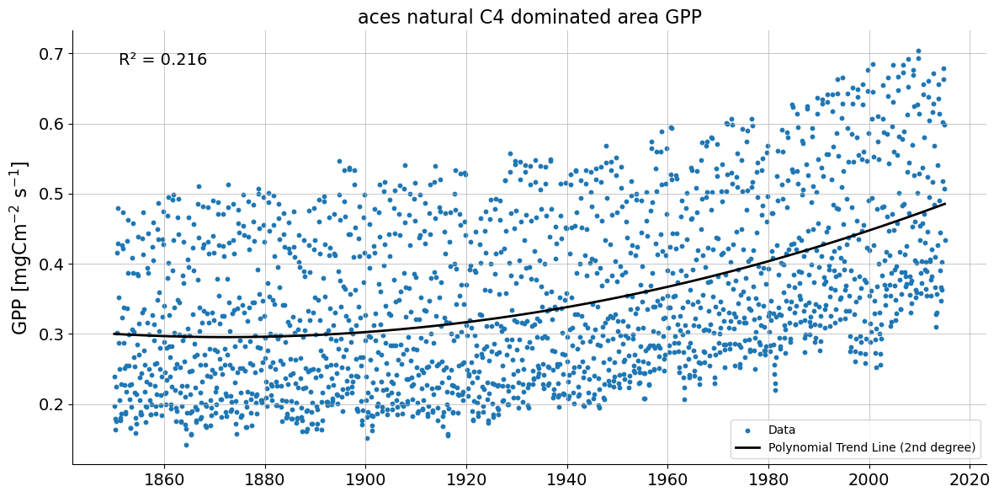

In [210]:
plotTimeSeriespPolyfit1(acesC4_domGPP_area_weighted, 
                        "aces natural C4 dominated area GPP",
                        'aces_withC4FracNatC4gpp1.png')

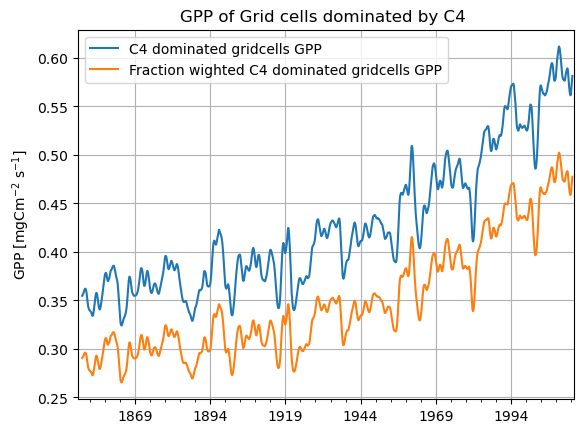

In [215]:
# Use moving average of last 6 months

aces_trend1_moving_average = aces_trend1.rolling(window=12).mean()
aces_trend2_moving_average = aces_trend2.rolling(window=12).mean()
aces_trend1_moving_average.plot(label = 'C4 dominated gridcells GPP')
aces_trend2_moving_average.plot(label = 'Fraction wighted C4 dominated gridcells GPP')
plt.ylabel('GPP [mgCm$^{-2}$ s$^{-1}$]')
plt.title('GPP of Grid cells dominated by C4 ')
plt.grid()
plt.legend()
plt.show()

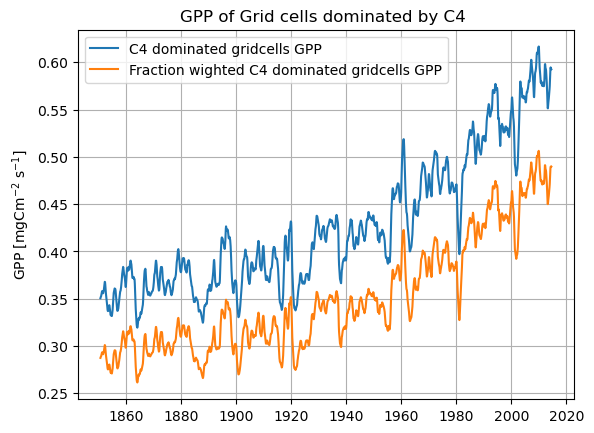

In [219]:
date_range = pd.date_range(start='15/01/1850', periods=1980, freq='M')
# Use moving average of last 6 months
plt.plot(date_range, aces_trend1, label = 'C4 dominated gridcells GPP')
plt.plot(date_range, aces_trend2, label = 'Fraction wighted C4 dominated gridcells GPP')
plt.ylabel('GPP [mgCm$^{-2}$ s$^{-1}$]')
plt.title('GPP of Grid cells dominated by C4 ')
plt.grid()
plt.legend()
plt.show()

In [220]:
pwd

'/Users/jo122/CMIP6/Data_CMIP6_model_output/CMIP6_models/ACCESS-ESM1-5/checkNatC4GPP1'

In [276]:
cd ..

/Users/jo122/CMIP6/Data_CMIP6_model_output/CMIP6_models


In [277]:
cd CNRM-CM6-1/

/Users/jo122/CMIP6/Data_CMIP6_model_output/CMIP6_models/CNRM-CM6-1


# CNRM-CM6.1

In [279]:
#Load the gpp and area data for cncm2 for a start
cncmCrop = xr.open_dataset('cropFrac_Lmon_CNRM-CM6-1_historical_r1i1p1f2_gr_185001-201412.nc', 
                           decode_times = True)
cncmGpp = xr.open_dataset('gpp_Lmon_CNRM-CM6-1_historical_r1i1p1f2_gr_185001-201412.nc', 
                           decode_times = True)
cncmC3Pft = xr.open_dataset('c3PftFrac_Lmon_CNRM-CM6-1_historical_r1i1p1f2_gr_185001-201412.nc', 
                           decode_times = True)
cncmC4Pft = xr.open_dataset('c4PftFrac_Lmon_CNRM-CM6-1_historical_r1i1p1f2_gr_185001-201412.nc', 
                           decode_times = True)

In [267]:
cd ..

/Users/jo122/CMIP6/Data_CMIP6_model_output/CMIP6_models


In [268]:
cd CNRM-CM6-1/

/Users/jo122/CMIP6/Data_CMIP6_model_output/CMIP6_models/CNRM-CM6-1


In [280]:
# Calculate total vegetation
cncmTotFrac = cncmC3Pft['c3PftFrac']/100 + cncmC4Pft['c4PftFrac']/100

# Calculate crop fraction
cncmCropFrac = cncmCrop['cropFrac']/100

# Calculate total natural vegetation
# Subtract the total and the crops and ignore the unaligned coordinates
cncmNatFrac = cncmTotFrac.values - cncmCropFrac.values

# Or use their numpy array 
#cncmNatFrac1 = cncmTotFrac.values - cncmCropFrac.values

# Calculate C3 and C4 crop and natural Frac = tions

# Needed for this analysis
cncmC4Frac = cncmC4Pft['c4PftFrac']/100
cncmC4NatFrac = cncmC4Frac * cncmNatFrac


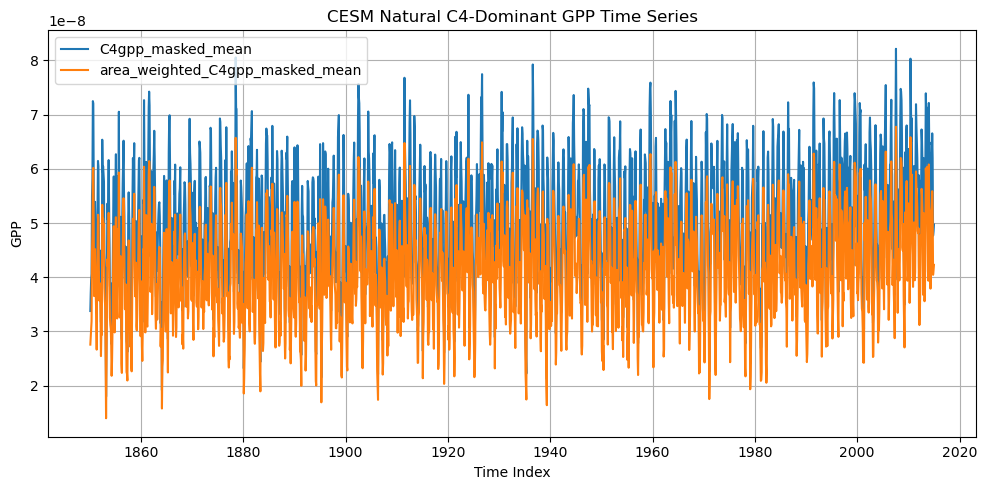

In [241]:
# Apply the function to calculate the time_series mean of C4 dominated GPP
cncmC4_domGPP, cncmC4_domGPP_area_weighted = plot_c4_dominant_gpp(cncmC4NatFrac, cncmGpp)

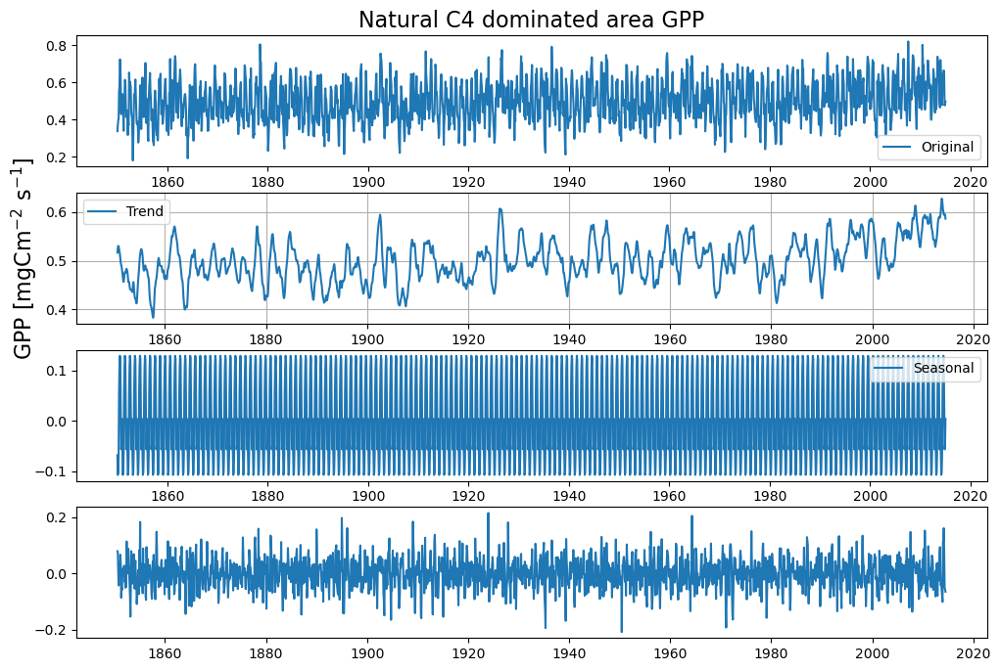

In [244]:
# Decompose the GPP time series for
cncm_trend1 = decomposePlot1(cncmC4_domGPP, 
                   'Natural C4 dominated area GPP','cncmC4timeseries_noC4Frac1.csv',
                   'cncmC4trend_noC4Frac1.csv','cncmDecomposedNatC4_noC4Frac1.png')

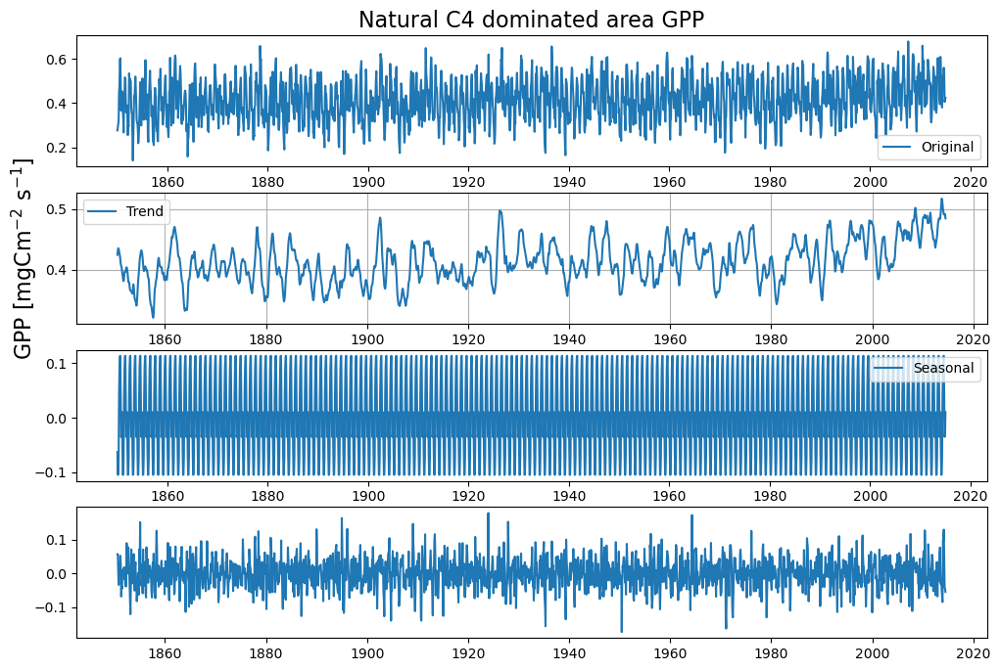

In [245]:
# Decompose the C4 fraction weighted GPP time series for
cncm_trend2 = decomposePlot1(cncmC4_domGPP_area_weighted, 
                   'Natural C4 dominated area GPP','cncmC4timeseries_withC4Frac1.csv',
                   'cncmC4trend_withC4Frac1.csv','cncmDecomposedNatC4_withC4Frac1.png')

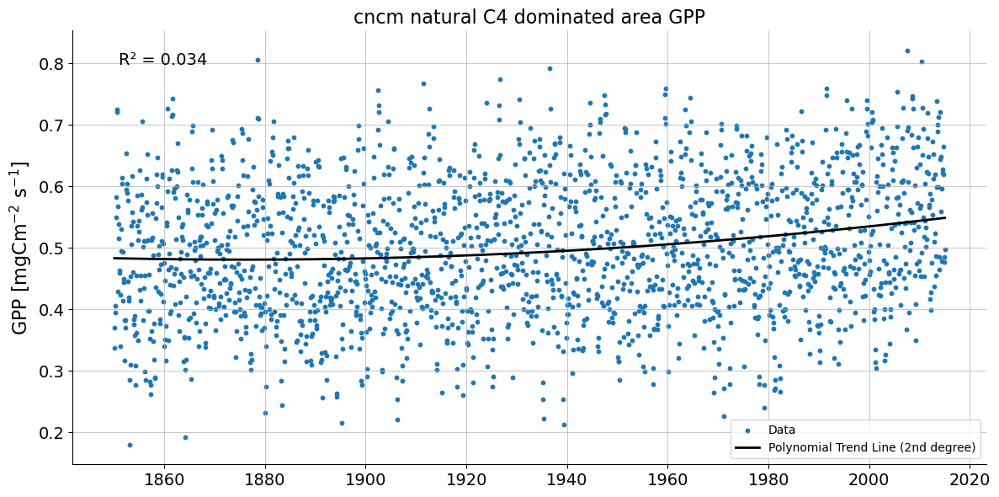

In [246]:
# Apply a polifit to the C4 dominant GPP trend 
plotTimeSeriespPolyfit1(cncmC4_domGPP, 
                        "cncm natural C4 dominated area GPP",
                        'cncm_noC4FracNatC4gpp1.png')

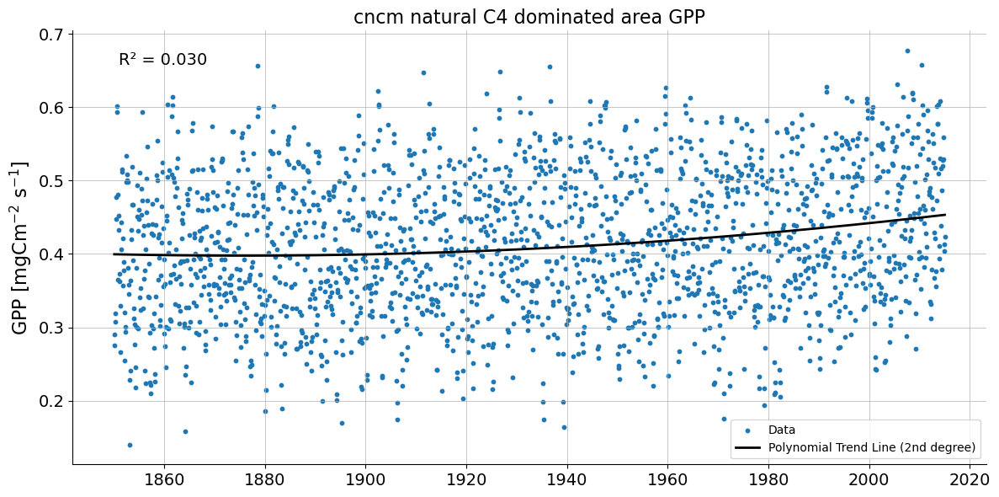

In [247]:
# Apply a polifit to the C4_fraction-weighted C4 dominant GPP trend 
plotTimeSeriespPolyfit1(cncmC4_domGPP_area_weighted, 
                        "cncm natural C4 dominated area GPP",
                        'cncm_withC4FracNatC4gpp1.png')

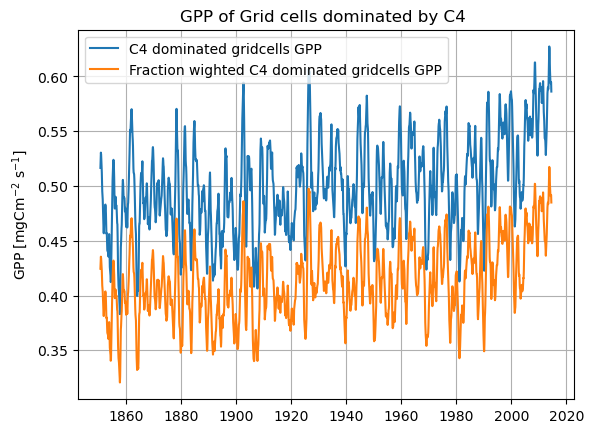

In [248]:
date_range = pd.date_range(start='15/01/1850', periods=1980, freq='M')
# Use moving average of last 6 months
plt.plot(date_range, cncm_trend1, label = 'C4 dominated gridcells GPP')
plt.plot(date_range, cncm_trend2, label = 'Fraction wighted C4 dominated gridcells GPP')
plt.ylabel('GPP [mgCm$^{-2}$ s$^{-1}$]')
plt.title('GPP of Grid cells dominated by C4 ')
plt.grid()
plt.legend()
plt.show()

# CNRM-ESM2

In [293]:
cd ..

/Users/jo122/CMIP6/Data_CMIP6_model_output/CMIP6_models/CNRM-ESM2


In [294]:
cd CNRM-ESM2/

[Errno 2] No such file or directory: 'CNRM-ESM2/'
/Users/jo122/CMIP6/Data_CMIP6_model_output/CMIP6_models/CNRM-ESM2


In [295]:
#Load the gpp and area data for cnes2 for a start
cnesCrop = xr.open_dataset('cropFrac_Lmon_CNRM-ESM2-1_historical_r1i1p1f2_gr_185001-201412.nc', 
                           decode_times = True)
cnesGpp = xr.open_dataset('gpp_Lmon_CNRM-ESM2-1_historical_r11i1p1f2_gr_185001-201412.nc', 
                           decode_times = True)
cnesC3Pft = xr.open_dataset('c3PftFrac_Lmon_CNRM-ESM2-1_historical_r1i1p1f2_gr_185001-201412.nc', 
                           decode_times = True)
cnesC4Pft = xr.open_dataset('c4PftFrac_Lmon_CNRM-ESM2-1_historical_r1i1p1f2_gr_185001-201412.nc', 
                           decode_times = True)

In [296]:
# Calculate total vegetation
cnesTotFrac = cnesC3Pft['c3PftFrac']/100 + cnesC4Pft['c4PftFrac']/100

# Calculate crop fraction
cnesCropFrac = cnesCrop['cropFrac']/100

# Calculate total natural vegetation
# Subtract the total and the crops and ignore the unaligned coordinates
cnesNatFrac = cnesTotFrac.values - cnesCropFrac.values

# Or use their numpy array 
#cnesNatFrac1 = cnesTotFrac.values - cnesCropFrac.values

# Calculate C3 and C4 crop and natural Fractions
# Needed for this analysis
cnesC4Frac = cnesC4Pft['c4PftFrac']/100
cnesC4NatFrac = cnesC4Frac * cnesNatFrac


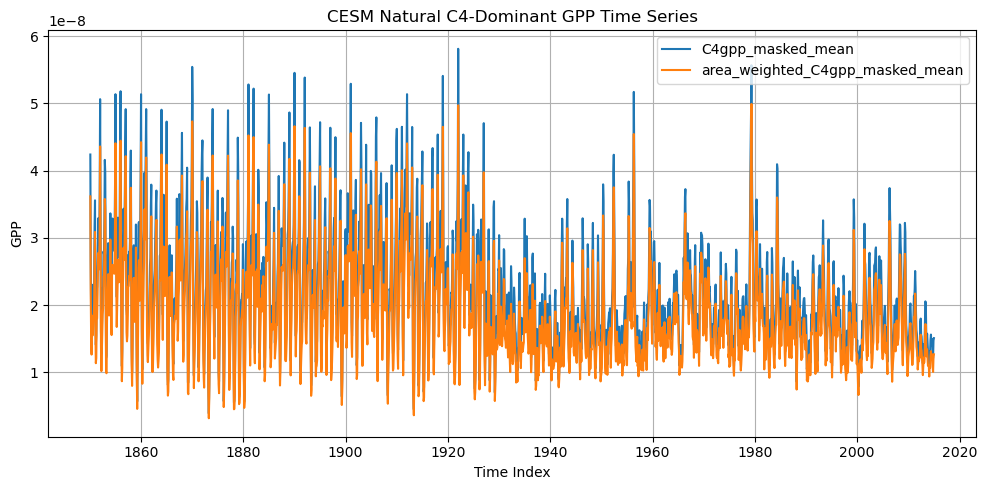

In [298]:
# Apply the function to calculate the time_series mean of C4 dominated GPP
cnesC4_domGPP, cnesC4_domGPP_area_weighted = plot_c4_dominant_gpp(cnesC4NatFrac, cnesGpp)

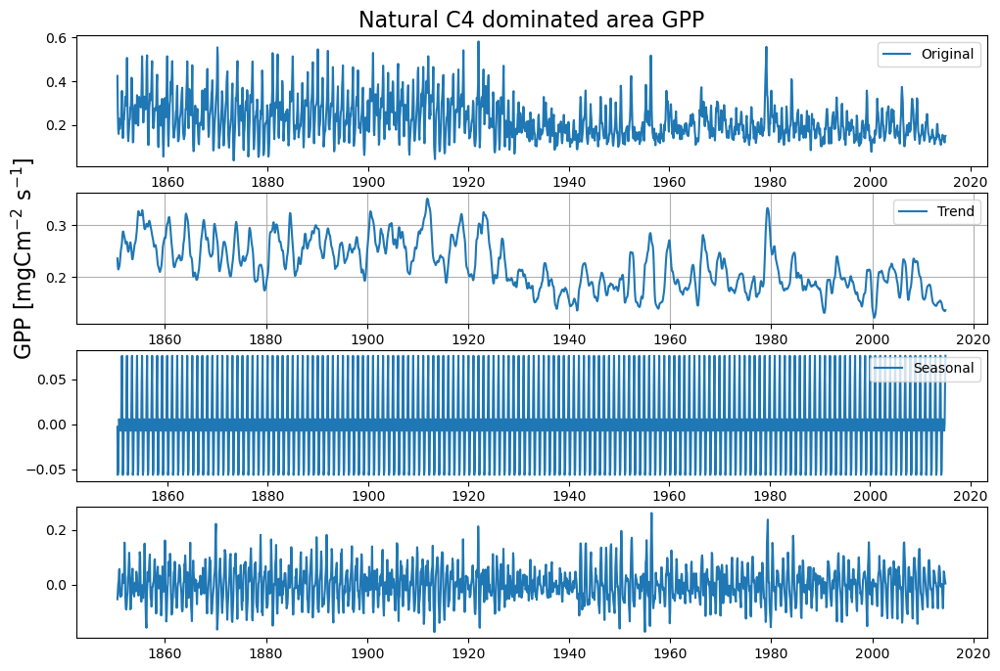

In [299]:
# Decompose the GPP time series for
cnes_trend1 = decomposePlot1(cnesC4_domGPP, 
                   'Natural C4 dominated area GPP','cnesC4timeseries_noC4Frac1.csv',
                   'cnesC4trend_noC4Frac1.csv','cnesDecomposedNatC4_noC4Frac1.png')

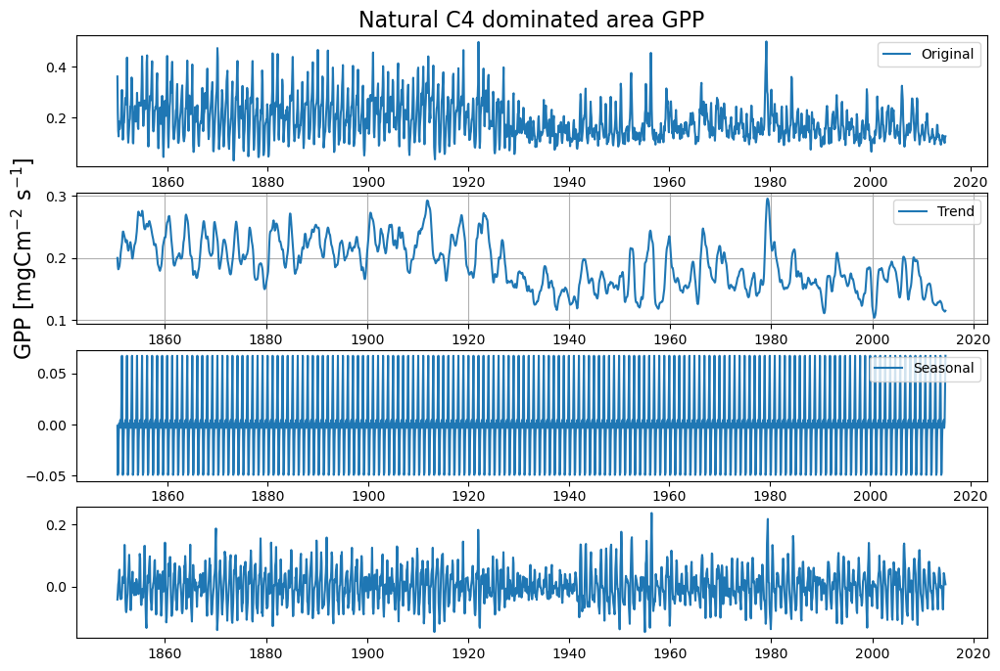

In [302]:
# Decompose the C4 fraction weighted GPP time series for
cnes_trend2 = decomposePlot1(cnesC4_domGPP_area_weighted, 
                   'Natural C4 dominated area GPP','cnesC4timeseries_withC4Frac1.csv',
                   'cnesC4trend_withC4Frac1.csv','cnesDecomposedNatC4_withC4Frac1.png')

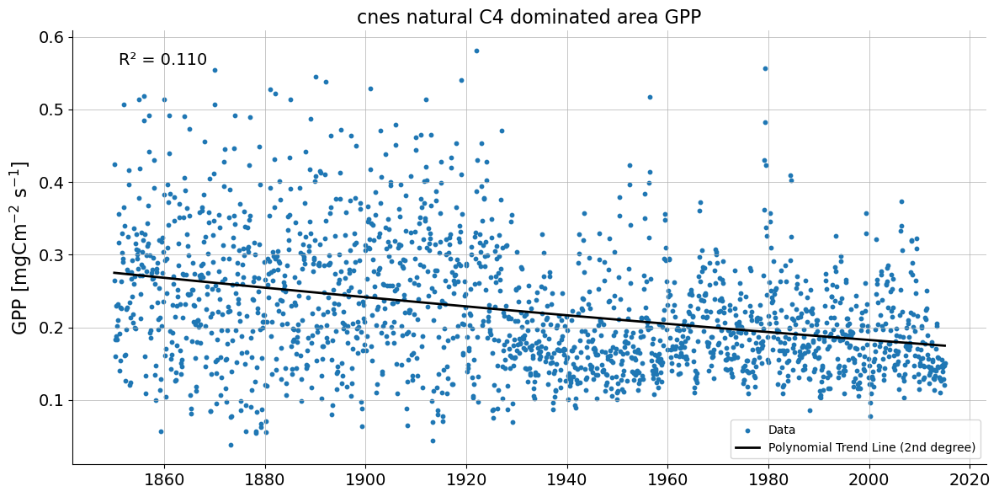

In [303]:
# Apply a polifit to the C4 dominant GPP trend 
plotTimeSeriespPolyfit1(cnesC4_domGPP, 
                        "cnes natural C4 dominated area GPP",
                        'cnes_noC4FracNatC4gpp1.png')

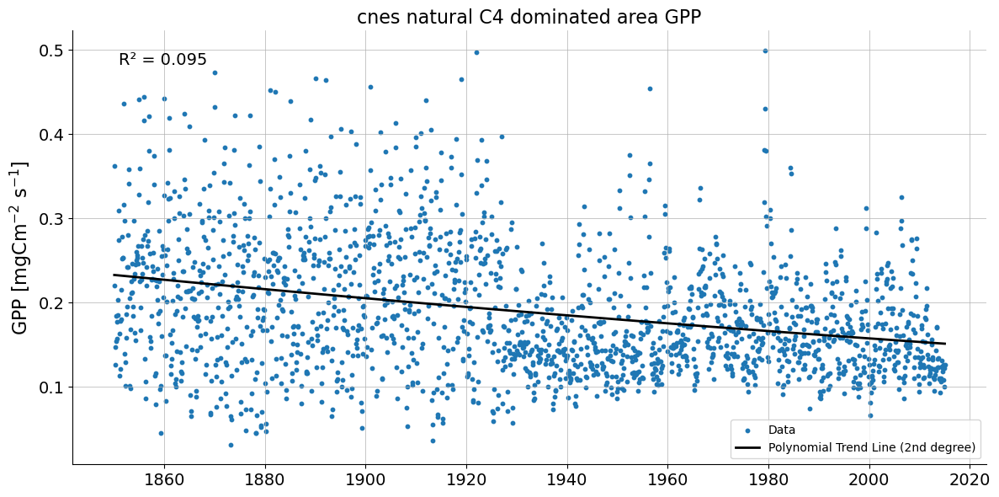

In [304]:
# Apply a polifit to the C4_fraction-weighted C4 dominant GPP trend 
plotTimeSeriespPolyfit1(cnesC4_domGPP_area_weighted, 
                        "cnes natural C4 dominated area GPP",
                        'cnes_withC4FracNatC4gpp1.png')

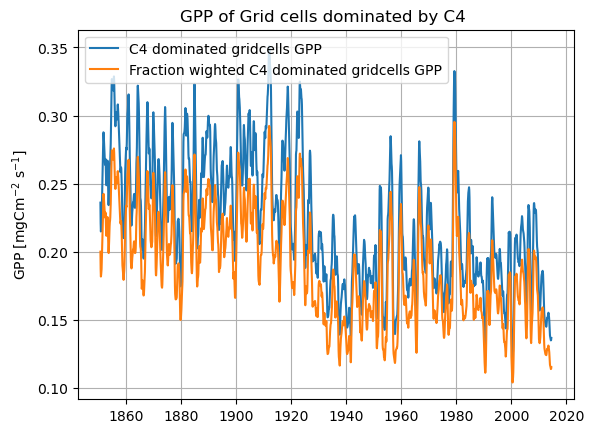

In [305]:
date_range = pd.date_range(start='15/01/1850', periods=1980, freq='M')
# Use moving average of last 6 months
plt.plot(date_range, cnes_trend1, label = 'C4 dominated gridcells GPP')
plt.plot(date_range, cnes_trend2, label = 'Fraction wighted C4 dominated gridcells GPP')
plt.ylabel('GPP [mgCm$^{-2}$ s$^{-1}$]')
plt.title('GPP of Grid cells dominated by C4 ')
plt.grid()
plt.legend()
plt.show()

# CMCC-ESM2

In [326]:
cd ..

/Users/jo122/CMIP6/Data_CMIP6_model_output/CMIP6_models


In [328]:
cd CMCC-ESM2/

/Users/jo122/CMIP6/Data_CMIP6_model_output/CMIP6_models/CMCC-ESM2


In [329]:
#Load the gpp and area data for cmes2 for a start
cmesCrop = xr.open_dataset('cropFrac_Lmon_CMCC-ESM2_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)
cmesGpp = xr.open_dataset('gpp_Lmon_CMCC-ESM2_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)
cmesC3Pft = xr.open_dataset('c3PftFrac_Lmon_CMCC-ESM2_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)
cmesC4Pft = xr.open_dataset('c4PftFrac_Lmon_CMCC-ESM2_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)

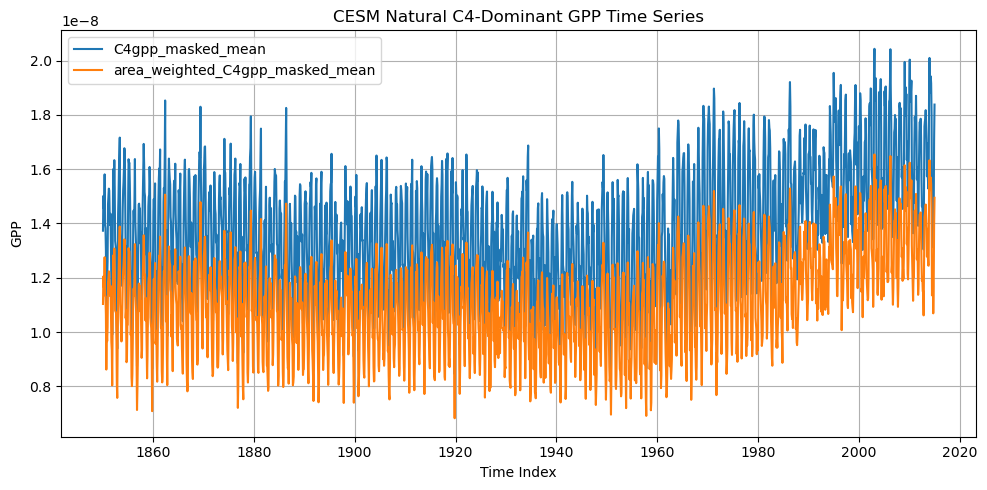

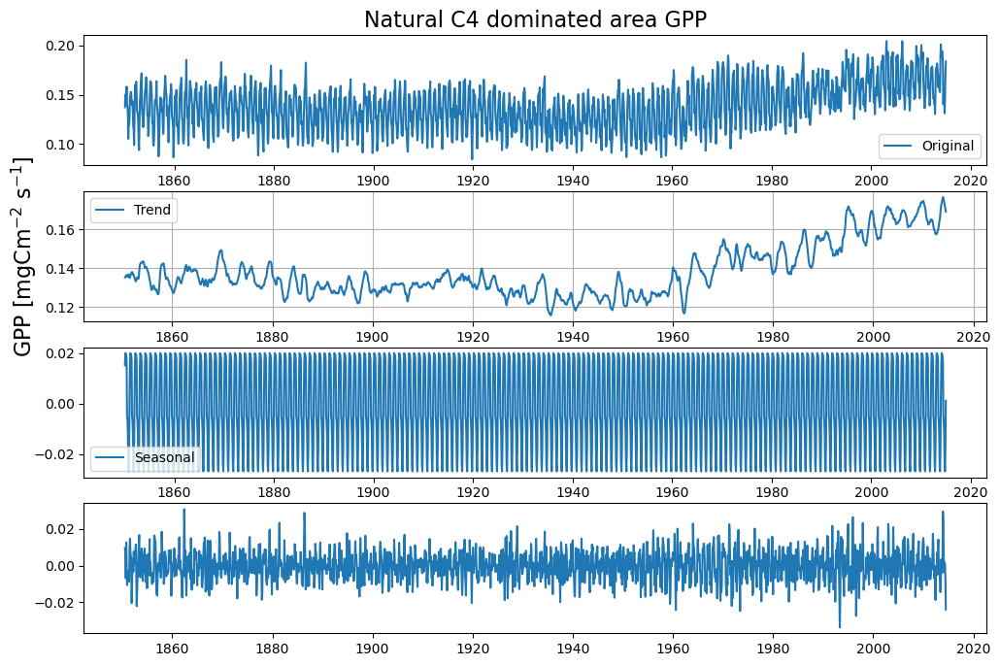

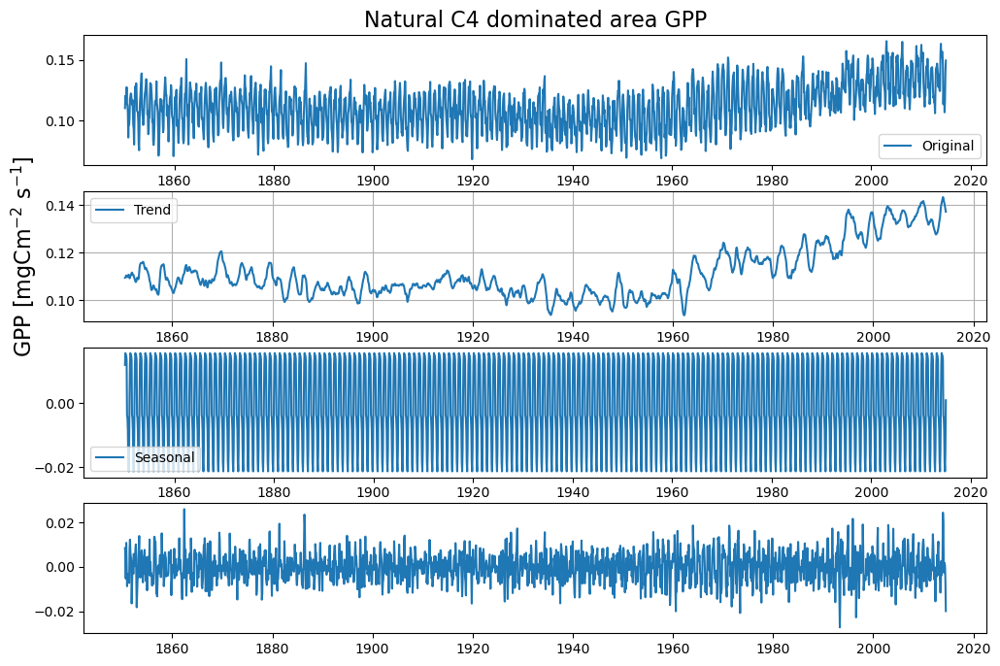

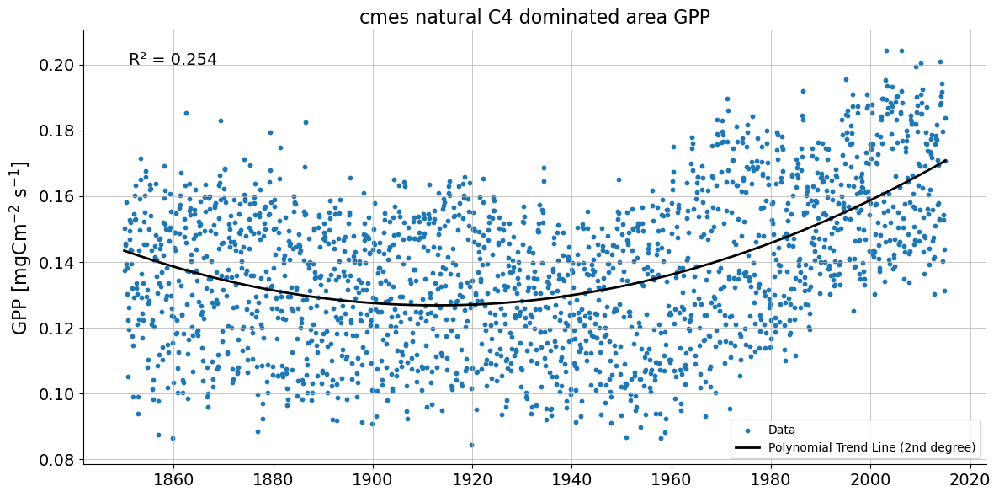

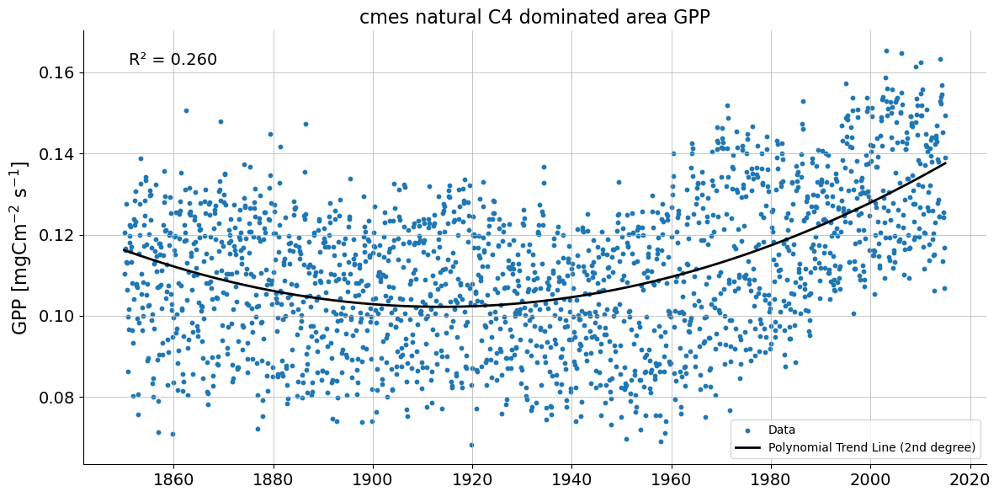

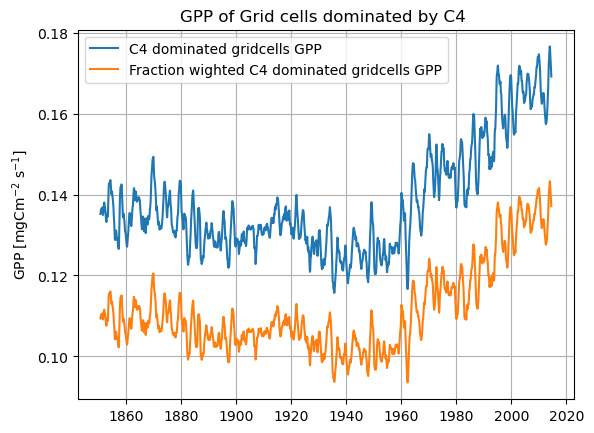

In [332]:
# Calculate total vegetation
cmesTotFrac = cmesC3Pft['c3PftFrac']/100 + cmesC4Pft['c4PftFrac']/100

# Calculate crop fraction
cmesCropFrac = cmesCrop['cropFrac']/100

# Calculate total natural vegetation
# Subtract the total and the crops and ignore the unaligned coordinates
cmesNatFrac = cmesTotFrac.values - cmesCropFrac.values

# Or use their numpy array 
#cmesNatFrac1 = cmesTotFrac.values - cmesCropFrac.values

# Calculate C3 and C4 crop and natural Fractions
# Needed for this analysis
cmesC4Frac = cmesC4Pft['c4PftFrac']/100
cmesC4NatFrac = cmesC4Frac * cmesNatFrac


# Apply the function to calculate the time_series mean of C4 dominated GPP
cmesC4_domGPP, cmesC4_domGPP_area_weighted = plot_c4_dominant_gpp(cmesC4NatFrac, cmesGpp)

# Decompose the GPP time series for
cmes_trend1 = decomposePlot1(cmesC4_domGPP, 
                   'Natural C4 dominated area GPP','cmesC4timeseries_noC4Frac1.csv',
                   'cmesC4trend_noC4Frac1.csv','cmesDecomposedNatC4_noC4Frac1.png')

# Decompose the C4 fraction weighted GPP time series for
cmes_trend2 = decomposePlot1(cmesC4_domGPP_area_weighted, 
                   'Natural C4 dominated area GPP','cmesC4timeseries_withC4Frac1.csv',
                   'cmesC4trend_withC4Frac1.csv','cmesDecomposedNatC4_withC4Frac1.png')


# Apply a polifit to the C4 dominant GPP trend 
plotTimeSeriespPolyfit1(cmesC4_domGPP, 
                        "cmes natural C4 dominated area GPP",
                        'cmes_noC4FracNatC4gpp1.png')

# Apply a polifit to the C4_fraction-weighted C4 dominant GPP trend 
plotTimeSeriespPolyfit1(cmesC4_domGPP_area_weighted, 
                        "cmes natural C4 dominated area GPP",
                        'cmes_withC4FracNatC4gpp1.png')

date_range = pd.date_range(start='15/01/1850', periods=1980, freq='M')
# Use moving average of last 6 months
plt.plot(date_range, cmes_trend1, label = 'C4 dominated gridcells GPP')
plt.plot(date_range, cmes_trend2, label = 'Fraction wighted C4 dominated gridcells GPP')
plt.ylabel('GPP [mgCm$^{-2}$ s$^{-1}$]')
plt.title('GPP of Grid cells dominated by C4 ')
plt.grid()
plt.legend()
plt.show()

# CanESM5

In [334]:
cd ..

/Users/jo122/CMIP6/Data_CMIP6_model_output/CMIP6_models


In [335]:
cd CanESM5/

/Users/jo122/CMIP6/Data_CMIP6_model_output/CMIP6_models/CanESM5


In [347]:
#Load the gpp and area data for caes2 for a start
caesCrop = xr.open_dataset('cropFrac_Lmon_CanESM5_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)
caesGpp = xr.open_dataset('gpp_Lmon_CanESM5_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)
caesC3Pft = xr.open_dataset('c3PftFrac_Lmon_CanESM5_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)
caesC4Pft = xr.open_dataset('c4PftFrac_Lmon_CanESM5_historical_r1i1p1f1_gn_185001-201412.nc', 
                           decode_times = True)

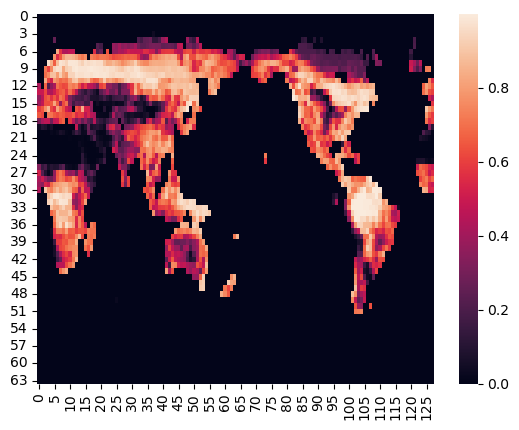

In [344]:
sns.heatmap(np.flip(caesNatFrac[-6,:,:], axis = 0))
plt.show()

In [346]:
caesGpp[]

<xarray.Dataset> Size: 65MB
Dimensions:    (time: 1980, bnds: 2, lat: 64, lon: 128)
Coordinates:
  * time       (time) object 16kB 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
  * lat        (lat) float64 512B -87.86 -85.1 -82.31 ... 82.31 85.1 87.86
  * lon        (lon) float64 1kB 0.0 2.812 5.625 8.438 ... 351.6 354.4 357.2
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) object 32kB ...
    lat_bnds   (lat, bnds) float64 1kB ...
    lon_bnds   (lon, bnds) float64 2kB ...
    gpp        (time, lat, lon) float32 65MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
Attributes: (12/53)
    CCCma_model_hash:            3dedf95315d603326fde4f5340dc0519d80d10c0
    CCCma_parent_runid:          rc3-pictrl
    CCCma_pycmor_hash:           33c30511acc319a98240633965a04ca99c26427e
    CCCma_runid:                 rc3.1-his01
    Conventions:                 CF-1.7 CMIP-6.2
    YMDH_branch_time_in_child:   1850:01:01:00
    ...                          ...
    tracking_id:                 hdl:21.14100/387658c8-f085-4ab8-995c-def848e...
    variable_id:                 gpp
    variant_label:               r1i1p1f1
    version:                     v20190429
    license:                     CMIP6 model data produced by The Government ...
    cmor_version:                3.4.0

In [423]:
import numpy as np
import matplotlib.pyplot as plt

# Note: for CanESM5, I have to redefined the threshold to 0.455 as it seems the natural C4 
# fraction is far lower than what we have in the other models

def plot_c4_dominant_gpp_caes(caesC4NatFrac, caesGpp, threshold=0.455):
    """
    Plots GPP time series where natural C4 vegetation dominates.

    Parameters:
    - caesC4NatFrac: xarray.DataArray or Dataset of C4 fraction (dimensions: time, lat, lon)
    - caesGpp: xarray.Dataset or DataArray with 'gpp' variable (same dimensions)
    - threshold: float, threshold to define "C4 dominant" (default = 0.75)
    """
    # Extract numpy arrays
    c4_frac = caesC4NatFrac.values
    gpp = caesGpp['gpp'].values if isinstance(caesGpp, xr.Dataset) else caesGpp.values

    # Multiply GPP by C4 fraction
    gpp_weighted = c4_frac * gpp

    # Create mask where C4 fraction >= threshold
    mask = c4_frac >= threshold

    # Apply mask (set to np.nan where mask is False)
    gpp_masked = np.where(mask, gpp, np.nan)
    gpp_weighted_masked = np.where(mask, gpp_weighted, np.nan)

    # Compute spatial mean for each time step
    C4gpp_masked_mean = np.nanmean(gpp_masked, axis=(1, 2))
    area_weighted_C4gpp_masked_mean = np.nanmean(gpp_weighted_masked, axis=(1, 2))

    # Generate date range for the plot
    date_range = pd.date_range(start='15/01/1850', periods=1980, freq='M')
    
    # Plotting
    plt.figure(figsize=(10, 5))
    plt.plot(date_range, C4gpp_masked_mean, label='C4gpp_masked_mean')
    plt.plot(date_range,  area_weighted_C4gpp_masked_mean, 
             label='area_weighted_C4gpp_masked_mean')
    plt.xlabel("Time Index")
    plt.ylabel("GPP")
    plt.title("caes Natural C4-Dominant GPP Time Series")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    return C4gpp_masked_mean, area_weighted_C4gpp_masked_mean

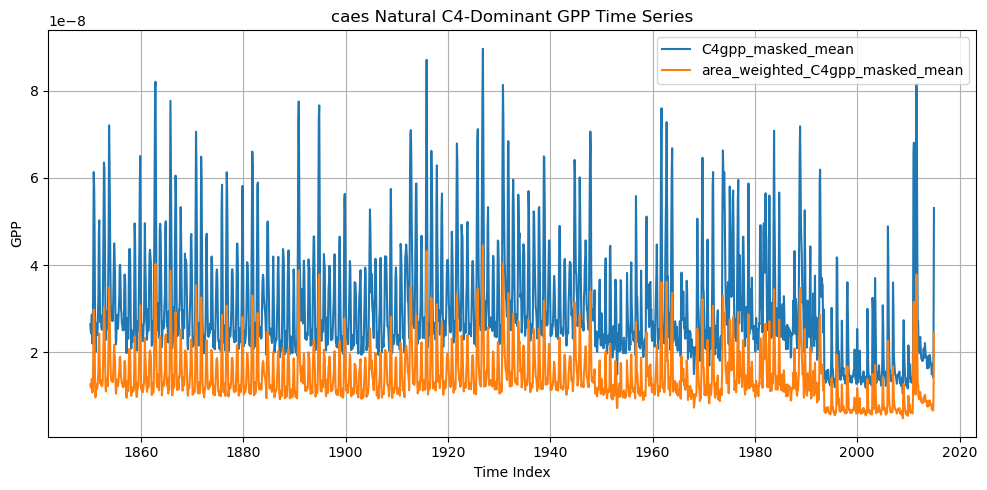

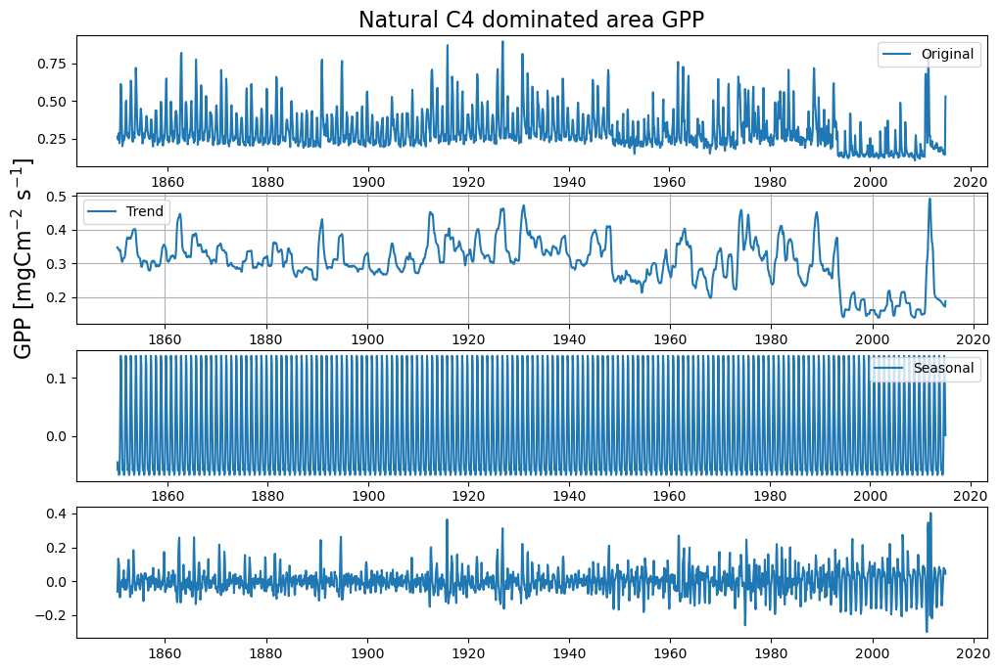

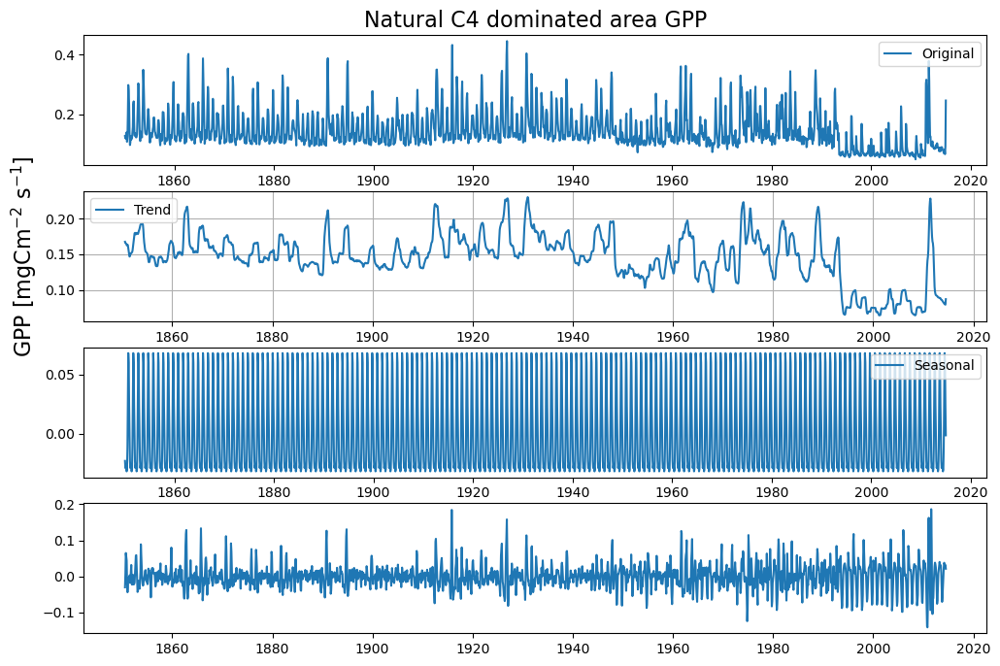

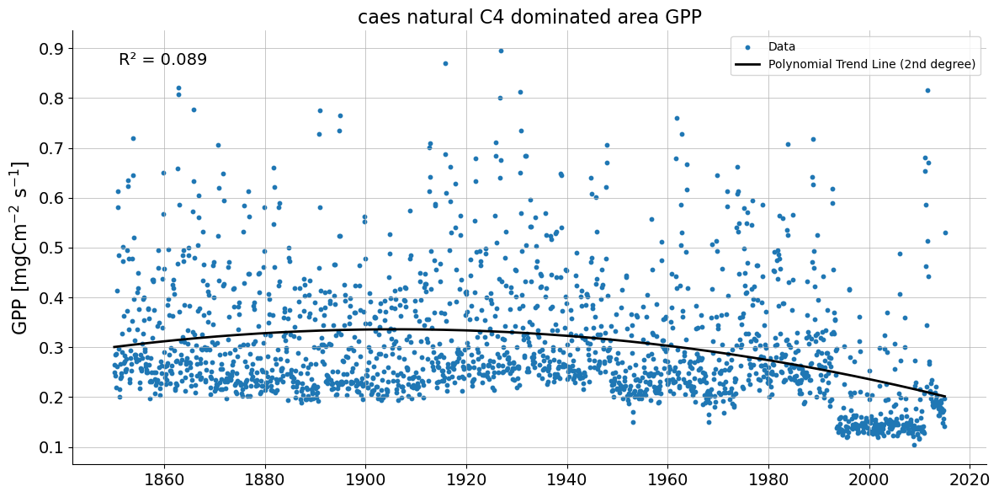

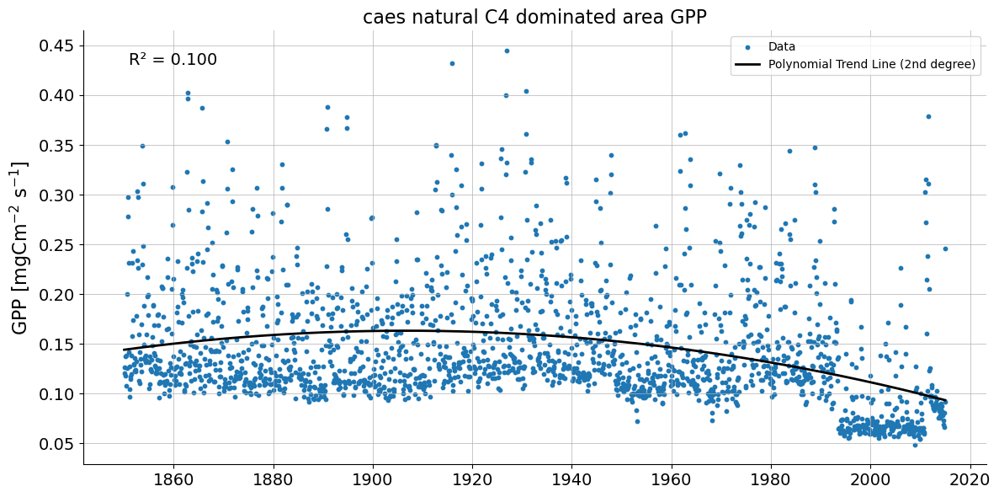

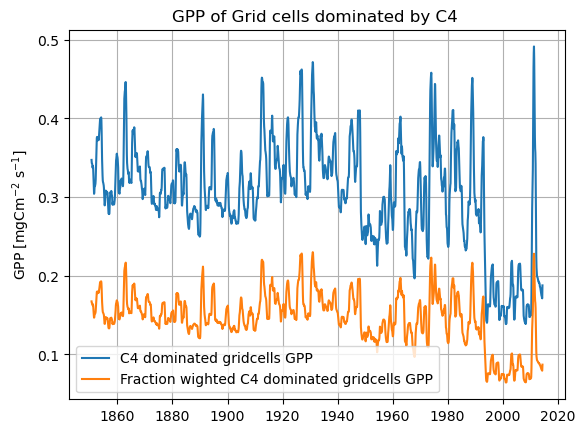

In [424]:
# Calculate total vegetation
caesTotFrac = caesC3Pft['c3PftFrac']/100 + caesC4Pft['c4PftFrac']/100

# Calculate crop fraction
caesCropFrac = caesCrop['cropFrac']/100

# Calculate total natural vegetation
# Subtract the total and the crops and ignore the unaligned coordinates
caesNatFrac = caesTotFrac.values - caesCropFrac.values

# Or use their numpy array 
#caesNatFrac1 = caesTotFrac.values - caesCropFrac.values

# Calculate C3 and C4 crop and natural Fractions
# Needed for this analysis
caesC4Frac = caesC4Pft['c4PftFrac']/100
caesC4NatFrac = caesC4Frac * caesNatFrac


# Apply the function to calculate the time_series mean of C4 dominated GPP
caesC4_domGPP, caesC4_domGPP_area_weighted = plot_c4_dominant_gpp_caes(caesC4NatFrac, caesGpp)

# Decompose the GPP time series for
caes_trend1 = decomposePlot1(caesC4_domGPP, 
                   'Natural C4 dominated area GPP','caesC4timeseries_noC4Frac1.csv',
                   'caesC4trend_noC4Frac1.csv','caesDecomposedNatC4_noC4Frac1.png')

# Decompose the C4 fraction weighted GPP time series for
caes_trend2 = decomposePlot1(caesC4_domGPP_area_weighted, 
                   'Natural C4 dominated area GPP','caesC4timeseries_withC4Frac1.csv',
                   'caesC4trend_withC4Frac1.csv','caesDecomposedNatC4_withC4Frac1.png')


# Apply a polifit to the C4 dominant GPP trend 
plotTimeSeriespPolyfit1(caesC4_domGPP, 
                        "caes natural C4 dominated area GPP",
                        'caes_noC4FracNatC4gpp1.png')

# Apply a polifit to the C4_fraction-weighted C4 dominant GPP trend 
plotTimeSeriespPolyfit1(caesC4_domGPP_area_weighted, 
                        "caes natural C4 dominated area GPP",
                        'caes_withC4FracNatC4gpp1.png')

date_range = pd.date_range(start='15/01/1850', periods=1980, freq='M')
# Use moving average of last 6 months
plt.plot(date_range, caes_trend1, label = 'C4 dominated gridcells GPP')
plt.plot(date_range, caes_trend2, label = 'Fraction wighted C4 dominated gridcells GPP')
plt.ylabel('GPP [mgCm$^{-2}$ s$^{-1}$]')
plt.title('GPP of Grid cells dominated by C4 ')
plt.grid()
plt.legend()
plt.show()

In [439]:
# Stack C4 dominated gridcell GPP 
C4_dom = np.vstack([aces_trend1, caes_trend1, cesm_trend1, cmes_trend1, 
                   cncm_trend1, cnes_trend1, mpeh_trend1, ukes_trend1])

#Calculate the ensemble mean
C4_dom_mean = (aces_trend1 + caes_trend1 + cesm_trend1 + cmes_trend1 + 
            cncm_trend1 + cnes_trend1 + mpeh_trend1 + ukes_trend1)/8

In [479]:
# Convert the to dataframe
df_c4_dom = pd.DataFrame(C4_dom)

# Optionally, you can add row or column labels
df_c4_dom.index = ['ACCESS_ESM1-5', 'CanESM5', 'CESM2', 'CMCC_ESM2', 'CNRM-CM6-1', 
                   'CNRM-ESM2-1', 'MPI-ESM1-2-HAM', 'UKESM1-0_LL']
df_c4_dom.columns = pd.date_range(start='15/01/1850', periods=1980, freq='M')

print(df_c4_dom.head())

# Transpose the columns

df_c4_dom1 = df_c4_dom.T

# Save to CSV
df_c4_dom1.to_csv("C4_dominatedGridcellGPPmgCms.csv", index=False)


               1850-01-31  1850-02-28  1850-03-31  1850-04-30  1850-05-31  \
ACCESS_ESM1-5         NaN         NaN         NaN         NaN         NaN   
CanESM5               NaN         NaN         NaN         NaN         NaN   
CESM2                 NaN         NaN         NaN         NaN         NaN   
CMCC_ESM2             NaN         NaN         NaN         NaN         NaN   
CNRM-CM6-1            NaN         NaN         NaN         NaN         NaN   

               1850-06-30  1850-07-31  1850-08-31  1850-09-30  1850-10-31  \
ACCESS_ESM1-5         NaN    0.350475    0.351512    0.352000    0.352687   
CanESM5               NaN    0.347323    0.343246    0.342813    0.341841   
CESM2                 NaN    0.236182    0.235556    0.232946    0.230267   
CMCC_ESM2             NaN    0.135188    0.135565    0.135840    0.136433   
CNRM-CM6-1            NaN    0.516524    0.525456    0.530491    0.528887   

               ...  2014-03-31  2014-04-30  2014-05-31  2014-06-30  \
ACCE

In [605]:
df_c4_dom1['Mean'] = df_c4_dom1.mean(axis = 1)
df_c4_dom1.to_csv('C4_dominatedGridcellGPPmgCms_andMean.csv', index=False)

In [463]:
df_c4_dom1 = df_c4_dom.T

In [464]:
df_c4_dom1.head()

,ACCESS_ESM1-5,CanESM5,CESM2,CMCC_ESM2,CNRM-CM6-1,CNRM-ESM2-1,MPI-ESM1-2-HAM,UKESM1-0_LL
1850-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850-02-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850-05-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


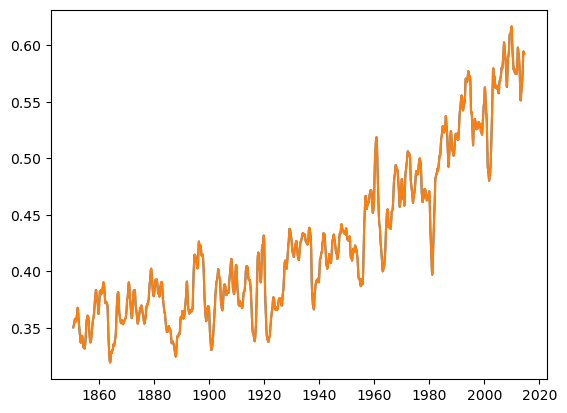

In [466]:
plt.plot(df_c4_dom1.index, df_c4_dom1['ACCESS_ESM1-5'])
plt.show()

In [467]:

df_c4_dom1.to_csv("C4_dominatedGridcellGPPmgCms.csv", index=False)


In [468]:
pwd

'/Users/jo122/CMIP6/2025/PaperFigures_06052025'

In [520]:
# Stack C4 dominated gridcell GPP 
C4_dom1 = np.vstack([aces_trend2, caes_trend2, cesm_trend2, cmes_trend2, 
                   cncm_trend2, cnes_trend2, mpeh_trend2, ukes_trend2])

#Calculate the ensemble mean
C4_dom_mean1 = (aces_trend2 + caes_trend2 + cesm_trend2 + cmes_trend2 + 
            cncm_trend2 + cnes_trend2 + mpeh_trend2 + ukes_trend2)/8

In [474]:
import pandas as pd

# Assuming C4_dom is a NumPy array created using np.vstack([...])
df_c4_dom2 = pd.DataFrame(C4_dom1)

# Optionally, you can add row or column labels
df_c4_dom2.index = ['ACCESS_ESM1-5', 'CanESM5', 'CESM2', 'CMCC_ESM2', 'CNRM-CM6-1', 
                   'CNRM-ESM2-1', 'MPI-ESM1-2-HAM', 'UKESM1-0_LL']
df_c4_dom2.columns= pd.date_range(start='15/01/1850', periods=1980, freq='M')


# Transpose the columns

df_c4_dom2a = df_c4_dom2.T

print(df_c4_dom2a.head(2))



# Save to CSV
df_c4_dom2a.to_csv("C4_dominatedGridcellGPPmgCmsFractionWeighted.csv", index=False)


            ACCESS_ESM1-5  CanESM5  CESM2  CMCC_ESM2  CNRM-CM6-1  CNRM-ESM2-1  \
1850-01-31            NaN      NaN    NaN        NaN         NaN          NaN   
1850-02-28            NaN      NaN    NaN        NaN         NaN          NaN   

            MPI-ESM1-2-HAM  UKESM1-0_LL  
1850-01-31             NaN          NaN  
1850-02-28             NaN          NaN  


In [596]:
df_c4_dom2a

,ACCESS_ESM1-5,CanESM5,CESM2,CMCC_ESM2,CNRM-CM6-1,CNRM-ESM2-1,MPI-ESM1-2-HAM,UKESM1-0_LL
1850-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850-02-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850-05-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
2014-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-09-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-10-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-11-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [597]:
df_c4_dom2a['Mean'] = df_c4_dom2a.mean(axis = 1)
df_c4_dom2a.to_csv('Natc4Dom_GPPweighted.csv', index=False)

In [600]:
df_c4_dom2a.to_csv('Natc4Dom_GPPweighted.csv', index=False)

In [603]:
# Calculate the 5 years mean of the carbon content
df_c4_dom2_yr = df_c4_dom2a.groupby(np.arange(len(df_c4_dom2a)) // 12).mean()

In [515]:
# Calculate the 5 years mean of the carbon content
df_c4_dom1_5yearsMean = df_c4_dom1.groupby(np.arange(len(df_c4_dom1)) // 60).mean()

In [516]:
#Calculate the mean of the models

df_c4_dom1_5yrMean = df_c4_dom1_5yearsMean.mean(axis=1)

In [523]:
# 5 years mean for trend 2 
df_c4_dom_5yrMean2 = df_c4_dom2a.groupby(np.arange(len(df_c4_dom2a)) // 60).mean()

In [524]:
df_c4_dom_5yrMean_mean = df_c4_dom_5yrMean2.mean(axis=1)

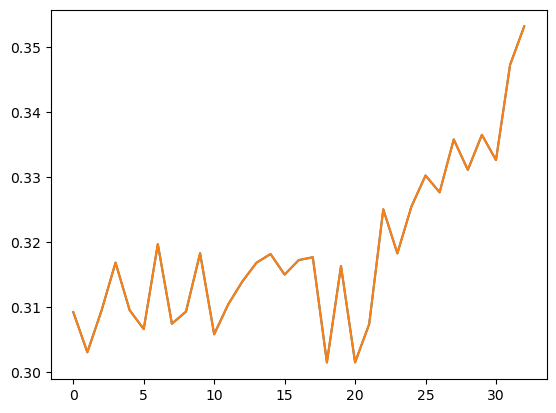

In [484]:
# Visualize the mean
df_c4_dom1_5yrMean.plot()
plt.show()

In [485]:
df_c4_dom1_5yearsMean

,ACCESS_ESM1-5,CanESM5,CESM2,CMCC_ESM2,CNRM-CM6-1,CNRM-ESM2-1,MPI-ESM1-2-HAM,UKESM1-0_LL
0,0.347917,0.352334,0.239139,0.137852,0.466462,0.264472,0.474924,0.190548
1,0.359208,0.305526,0.239231,0.133480,0.467455,0.274472,0.449962,0.194736
2,0.360607,0.345331,0.230925,0.136114,0.488172,0.266751,0.477950,0.169276
3,0.356551,0.339773,0.241563,0.136594,0.493847,0.250271,0.500277,0.215700
4,0.370814,0.312366,0.241331,0.136837,0.487772,0.247003,0.462578,0.217271
5,0.374345,0.306548,0.251548,0.135683,0.485379,0.226062,0.483652,0.189374
6,0.375567,0.325044,0.244373,0.132192,0.491592,0.266031,0.497864,0.224688
7,0.342275,0.275137,0.259659,0.129232,0.481467,0.256990,0.501994,0.212484
8,0.375151,0.331893,0.249428,0.129127,0.454015,0.257897,0.453291,0.223389
9,0.395578,0.298477,0.247029,0.130299,0.479415,0.241061,0.503570,0.250770


In [539]:
# Define the plotting function
def plot_fig(ax, years, y, mean):
    colors = ['blue', 'brown', 'gold', 'violet', 'lime',
              'magenta', 'darkgreen', 'aqua']
    labels = ['ACCESS-ESM1-5', 'CanESM5', 'CESM2', 'CMCC-ESM2', 'CNRM-CM6-1', 'CNRM-ESM2-1',
              'MPI-ESM-1-2-HAM', 'UKESM1-0-LL']
    linestyles = ['-', '--', '-', '-', '--', '-', '--', '--']

    for i in range(y.shape[1]):
        ax.plot(years, y.iloc[:, i], label=labels[i], color=colors[i],
                linestyle=linestyles[i], linewidth=2.5)

    ax.plot(years, mean, color='black', label='Ensemble mean', linestyle='-', linewidth=2.5)
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    return ax

<Figure size 640x480 with 0 Axes>

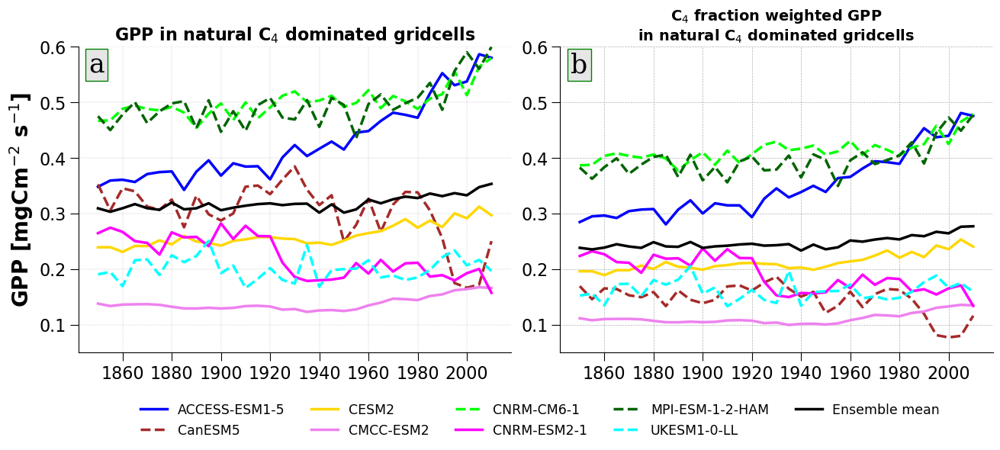

In [618]:
# Simulated data for demonstration
years5 = np.arange(1850, 2014, 5)

y1 = df_c4_dom1_5yearsMean.copy()  # 33 years, 8 models
y1_mean = df_c4_dom1_5yearsMean.mean(axis=1)

y2 = df_c4_dom_5yrMean2.copy()
y2_mean = df_c4_dom_5yrMean2.mean(axis=1)


# Create the mosaic subplot layout
fig, axs = plt.subplot_mosaic([['a', 'b']], figsize=(13, 5), layout="constrained")

# Plotting the crop on the 'a' axis of the mosaic
plot_fig(ax=axs['a'], years=years5, y = y1, mean = y1_mean)
axs['a'].set_ylabel('GPP [mgCm$^{-2}$ s$^{-1}$]', fontsize=20, weight='bold')
axs['a'].set_title('GPP in natural C$_{4}$ dominated gridcells', fontsize=16, weight='bold')
axs['a'].tick_params(axis='both', which='both', labelsize=16, size=8)
axs['a'].spines['right'].set_visible(False)
axs['a'].spines['top'].set_visible(False)
axs['a'].grid(linestyle='--', linewidth=0.25)
axs['a'].set_ylim(0.05, 0.60)


# Plotting the natural on the 'b' axis of the mosaic
plot_fig(ax=axs['b'], years = years5, y = y2, mean = y2_mean)
axs['b'].set_title('C$_{4}$ fraction weighted GPP\nin natural C$_{4}$ dominated gridcells',
                   fontsize=14, weight='bold')
axs['b'].tick_params(axis='both', which='both', labelsize=16, size=8)
axs['b'].spines['right'].set_visible(False)
axs['b'].spines['top'].set_visible(False)
axs['b'].grid(linestyle='--', linewidth=0.5)
axs['b'].set_ylim(0.05, 0.60)

# Make the legend
handles, labels = [], []
for ax_key in ['a', 'b']:
    ax_handles, ax_labels = axs[ax_key].get_legend_handles_labels()
    handles.extend(ax_handles)
    labels.extend(ax_labels)

handles_labels = list(OrderedDict(zip(labels, handles)).items())
labels, handles = zip(*handles_labels)

fig.legend(handles, labels, fontsize=12.5, loc='upper left', ncol=5,
           bbox_to_anchor=(0.125, 0.3, 0.5, -0.315), frameon=False)

# Add subplot labels
for label, ax in axs.items():
    trans = mtransforms.ScaledTranslation(10/72, -5/72, fig.dpi_scale_trans)
    ax.text(0.0, 1.0, label, transform=ax.transAxes + trans,
            fontsize=25, verticalalignment='top', fontfamily='serif',
            bbox=dict(facecolor='0.9', edgecolor='green', pad=3.0))


# Save the plot
plt.savefig('c4Nat_domGPP_1850_2014_250623.png', 
            dpi=500, bbox_inches='tight', pad_inches=0.1)

# Show the plot
plt.show()


In [536]:
# Calculate their changes from 1850 to 2014: trend1 = y1a and trend2 = y2a

y1a = y1 - y1.iloc[0]
y1a_mean = y1_mean - y1_mean.iloc[0]

y2a = y2 - y2.iloc[0]
y2a_mean = y2_mean - y2_mean.iloc[0]

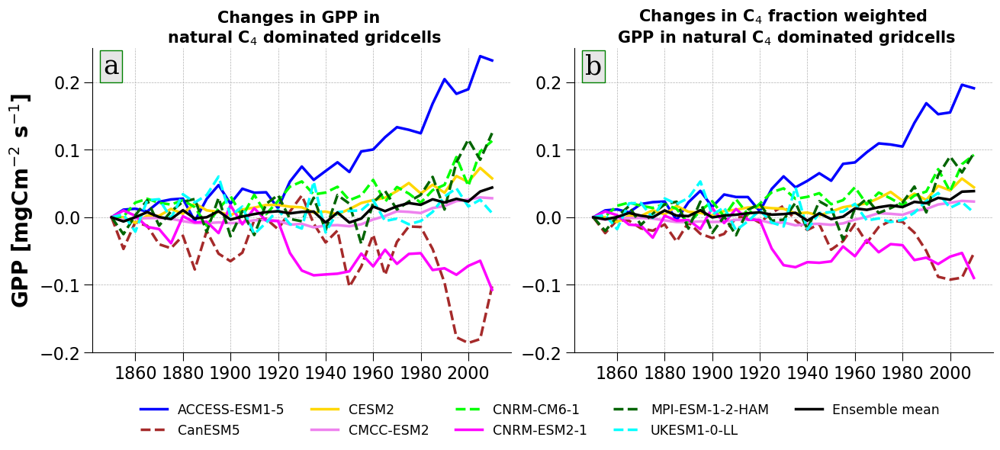

In [617]:
# Simulated data for demonstration
years5 = np.arange(1850, 2014, 5)


# Create the mosaic subplot layout
fig, axs = plt.subplot_mosaic([['a', 'b']], figsize=(13, 5), layout="constrained")

# Plotting the crop on the 'a' axis of the mosaic
plot_fig(ax=axs['a'], years=years5, y = y1a, mean = y1a_mean)
axs['a'].set_ylabel('GPP [mgCm$^{-2}$ s$^{-1}$]', fontsize=20, weight='bold')
axs['a'].set_title('Changes in GPP in \n natural C$_{4}$ dominated gridcells', 
                   fontsize=15, weight='bold')
axs['a'].tick_params(axis='both', which='both', labelsize=16, size=8)
axs['a'].spines['right'].set_visible(False)
axs['a'].spines['top'].set_visible(False)
axs['a'].grid(linestyle='--', linewidth=0.5)
axs['a'].set_ylim(-0.2, 0.25)

# Plotting the natural on the 'b' axis of the mosaic
plot_fig(ax=axs['b'], years = years5, y = y2a, mean = y2a_mean)
axs['b'].set_title('Changes in C$_{4}$ fraction weighted \n GPP in natural C$_{4}$ dominated gridcells',
                   fontsize=15, weight='bold')
axs['b'].tick_params(axis='both', which='both', labelsize=16, size=8)
axs['b'].spines['right'].set_visible(False)
axs['b'].spines['top'].set_visible(False)
axs['b'].grid(linestyle='--', linewidth=0.5)
axs['b'].set_ylim(-0.2, 0.25)


# Make the legend
handles, labels = [], []
for ax_key in ['a', 'b']:
    ax_handles, ax_labels = axs[ax_key].get_legend_handles_labels()
    handles.extend(ax_handles)
    labels.extend(ax_labels)

handles_labels = list(OrderedDict(zip(labels, handles)).items())
labels, handles = zip(*handles_labels)

fig.legend(handles, labels, fontsize=12.5, loc='upper left', ncol=5,
           bbox_to_anchor=(0.125, 0.3, 0.5, -0.315), frameon=False)

# Add subplot labels
for label, ax in axs.items():
    trans = mtransforms.ScaledTranslation(10/72, -5/72, fig.dpi_scale_trans)
    ax.text(0.0, 1.0, label, transform=ax.transAxes + trans,
            fontsize=25, verticalalignment='top', fontfamily='serif',
            bbox=dict(facecolor='0.9', edgecolor='green', pad=3.0))

# Show the plot
plt.show()

# Save the plot
plt.savefig('c4_1850_2014_Changes_250623.png', 
            dpi=500, bbox_inches='tight', pad_inches=0.1)


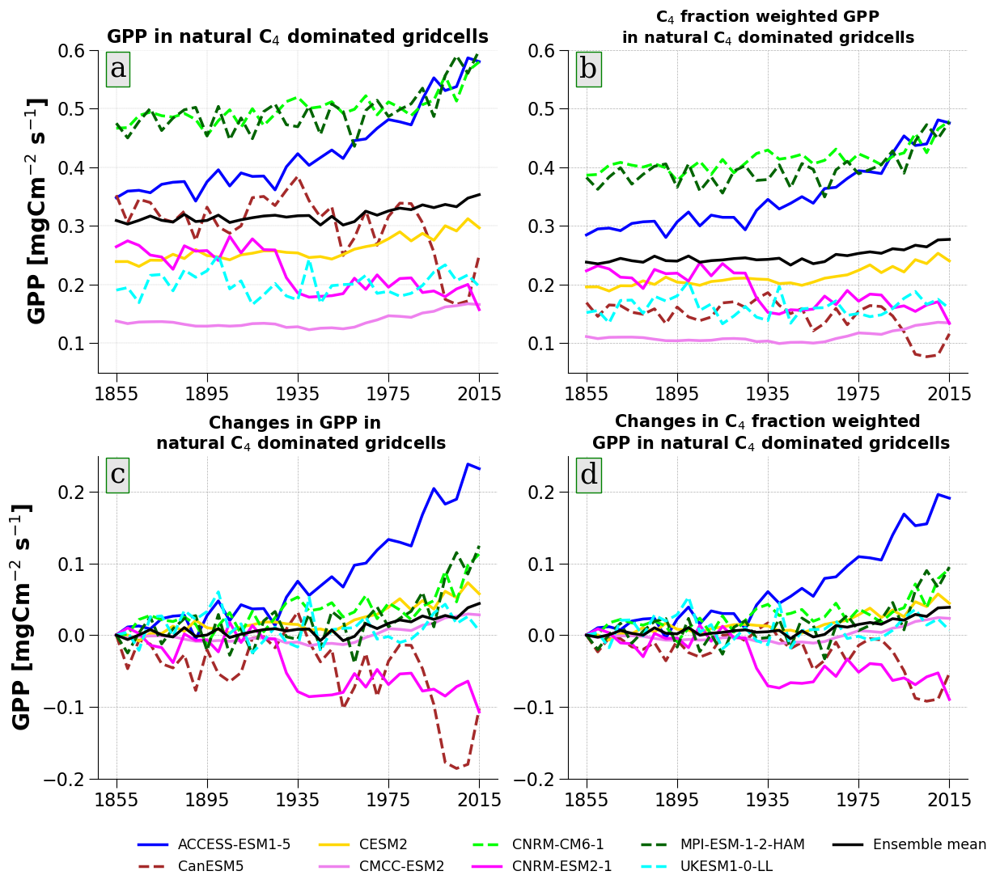

In [620]:
# Simulated data for demonstration
years5 = np.arange(1855, 2019, 5)

y1 = df_c4_dom1_5yearsMean.copy()  # 33 years, 8 models
y1_mean = df_c4_dom1_5yearsMean.mean(axis=1)

y2 = df_c4_dom_5yrMean2.copy()
y2_mean = df_c4_dom_5yrMean2.mean(axis=1)


# Create the mosaic subplot layout
fig, axs = plt.subplot_mosaic([['a', 'b'], ['c', 'd']], figsize=(12, 10), layout="constrained")

# Plotting the crop on the 'a' axis of the mosaic
plot_fig(ax=axs['a'], years=years5, y = y1, mean = y1_mean)
axs['a'].set_ylabel('GPP [mgCm$^{-2}$ s$^{-1}$]', fontsize=20, weight='bold')
axs['a'].set_title('GPP in natural C$_{4}$ dominated gridcells', fontsize=16, weight='bold')
axs['a'].tick_params(axis='both', which='both', labelsize=16, size=8)
axs['a'].spines['right'].set_visible(False)
axs['a'].spines['top'].set_visible(False)
axs['a'].grid(linestyle='--', linewidth=0.25)
axs['a'].set_ylim(0.05, 0.60)

# Set 5 evenly spaced ticks on the x-axis
axs['a'].set_xticks(np.linspace(years5[0], years5[-1], 5, dtype=int))


# Plotting the natural on the 'b' axis of the mosaic
plot_fig(ax=axs['b'], years = years5, y = y2, mean = y2_mean)
axs['b'].set_title('C$_{4}$ fraction weighted GPP\nin natural C$_{4}$ dominated gridcells',
                   fontsize=14, weight='bold')
axs['b'].tick_params(axis='both', which='both', labelsize=16, size=8)
axs['b'].spines['right'].set_visible(False)
axs['b'].spines['top'].set_visible(False)
axs['b'].grid(linestyle='--', linewidth=0.5)
axs['b'].set_ylim(0.05, 0.60)
# Set 5 evenly spaced ticks on the x-axis
axs['b'].set_xticks(np.linspace(years5[0], years5[-1], 5, dtype=int))


# Plotting the crop on the 'a' axis of the mosaic
plot_fig(ax=axs['c'], years=years5, y = y1a, mean = y1a_mean)
axs['c'].set_ylabel('GPP [mgCm$^{-2}$ s$^{-1}$]', fontsize=20, weight='bold')
axs['c'].set_title('Changes in GPP in \n natural C$_{4}$ dominated gridcells', 
                   fontsize=15, weight='bold')
axs['c'].tick_params(axis='both', which='both', labelsize=16, size=8)
axs['c'].spines['right'].set_visible(False)
axs['c'].spines['top'].set_visible(False)
axs['c'].grid(linestyle='--', linewidth=0.5)
axs['c'].set_ylim(-0.2, 0.25)
# Set 5 evenly spaced ticks on the x-axis
axs['c'].set_xticks(np.linspace(years5[0], years5[-1], 5, dtype=int))

# Plotting the natural on the 'b' axis of the mosaic
plot_fig(ax=axs['d'], years = years5, y = y2a, mean = y2a_mean)
axs['d'].set_title('Changes in C$_{4}$ fraction weighted \n GPP in natural C$_{4}$ dominated gridcells',
                   fontsize=15, weight='bold')
axs['d'].tick_params(axis='both', which='both', labelsize=16, size=8)
axs['d'].spines['right'].set_visible(False)
axs['d'].spines['top'].set_visible(False)
axs['d'].grid(linestyle='--', linewidth=0.5)
axs['d'].set_ylim(-0.2, 0.25)
#axs['d'].set_xlim(1850, 2015)

# Set 5 evenly spaced ticks on the x-axis
axs['d'].set_xticks(np.linspace(years5[0], years5[-1], 5, dtype=int))






# Make the legend
handles, labels = [], []
for ax_key in ['a', 'b']:
    ax_handles, ax_labels = axs[ax_key].get_legend_handles_labels()
    handles.extend(ax_handles)
    labels.extend(ax_labels)

handles_labels = list(OrderedDict(zip(labels, handles)).items())
labels, handles = zip(*handles_labels)

fig.legend(handles, labels, fontsize=12.5, loc='upper left', ncol=5,
           bbox_to_anchor=(0.125, 0.3, 0.5, -0.315), frameon=False)

# Add subplot labels
for label, ax in axs.items():
    trans = mtransforms.ScaledTranslation(10/72, -5/72, fig.dpi_scale_trans)
    ax.text(0.0, 1.0, label, transform=ax.transAxes + trans,
            fontsize=25, verticalalignment='top', fontfamily='serif',
            bbox=dict(facecolor='0.9', edgecolor='green', pad=3.0))


# Save the plot
plt.savefig('c4Nat_domGPP_change_1850_2014_250623.png', 
            dpi=500, bbox_inches='tight', pad_inches=0.1)

# Show the plot
plt.show()
